# Assignment 5

# Data Preparation


### Needed imports


In [1]:
import pandas as pd
import os
# from datetime import datetime
# import re # regex support
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import json
from sklearn.cluster import MeanShift, estimate_bandwidth, Birch
from kmodes.kmodes import KModes
from sklearn.metrics import silhouette_score, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neural_network import MLPRegressor
import h2o
from h2o.estimators import H2ORandomForestEstimator
from sklearn.linear_model import LinearRegression

#from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import random

### Data gathering


In [2]:
data_pathname = os.path.join(os.getcwd(), "data")
results_pathname = os.path.join(os.getcwd(), "results")
filename_citibike = "2015-citibike_tripdata_combined.csv"
filename_citibike_sample = "2015-citibike_tripdata_combined_sample.csv"
filename_weather = "weather_data_nyc.csv"
encoding_type = "utf-8"

# Change this flag if you want to use the full data set (~1,7gb). Warning: This will change the runtime significantly
use_sample_data = True

In [3]:
df_citibike = pd.DataFrame()
if use_sample_data:
    df_citibike = pd.read_csv(os.path.join(
        data_pathname, filename_citibike_sample), encoding=encoding_type)
else:
    df_citibike = pd.read_csv(os.path.join(
        data_pathname, filename_citibike), encoding=encoding_type)

df_weather = pd.read_csv(os.path.join(
    data_pathname, filename_weather), encoding=encoding_type)


# ETL Citibike dataset


In [4]:
print(f"Citibike DataFrame length: {len(df_citibike)}")
print(f"Show first and last rows of Citibike:")
df_citibike.iloc[[1, -1]]

Citibike DataFrame length: 99380
Show first and last rows of Citibike:


,Unnamed: 0,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender
1,1043212,1542,4/13/2015 08:07:06,4/13/2015 08:32:48,545,E 23 St & 1 Ave,40.736502,-73.978095,415,Pearl St & Hanover Square,40.704718,-74.009260,19785,Subscriber,1957.0,1
99379,8672150,418,11/14/2015 15:39:48,11/14/2015 15:46:46,317,E 6 St & Avenue B,40.724537,-73.981854,301,E 2 St & Avenue B,40.722174,-73.983688,19774,Subscriber,1961.0,1


In [5]:
print("Citibike DataFrame data types per column (auto import):")
print(f"{df_citibike.dtypes}")

Citibike DataFrame data types per column (auto import):
Unnamed: 0                   int64
tripduration                 int64
starttime                   object
stoptime                    object
start station id             int64
start station name          object
start station latitude     float64
start station longitude    float64
end station id               int64
end station name            object
end station latitude       float64
end station longitude      float64
bikeid                       int64
usertype                    object
birth year                 float64
gender                       int64
dtype: object


### Renaming


In [6]:
df_citibike.rename(columns={"Unnamed: 0": "uniqueid",
                            "start station id": "start_station_id",
                            "start station name": "start_station_name",
                            "start station latitude": "start_station_latitude",
                            "start station longitude": "start_station_longitude",
                            "end station id": "end_station_id",
                            "end station name": "end_station_name",
                            "end station latitude": "end_station_latitude",
                            "end station longitude": "end_station_longitude",
                            "birth year": "birth_year"}, inplace=True)


### Type Conversion


In [7]:
# Some timestamps are missing values for seconds
print("Convert column starttime and stoptime from object to datetime")
df_citibike['starttime'] = pd.to_datetime(df_citibike['starttime'], format="%m/%d/%Y %H:%M:%S", errors="coerce").fillna(
    pd.to_datetime(df_citibike['starttime'], format="%m/%d/%Y %H:%M", errors="coerce"))
df_citibike['stoptime'] = pd.to_datetime(df_citibike['stoptime'], format="%m/%d/%Y %H:%M:%S", errors="coerce").fillna(
    pd.to_datetime(df_citibike['stoptime'], format="%m/%d/%Y %H:%M", errors="coerce"))
print(
    f"Example after conversion: {df_citibike['stoptime'][42]} with type {df_citibike['stoptime'].dtype}")

Convert column starttime and stoptime from object to datetime
Example after conversion: 2015-06-30 17:59:00 with type datetime64[ns]


In [8]:
print("Checking for categorial values in the columns")
for column in df_citibike.columns:
    print(
        f"Column {column} has {df_citibike[column].value_counts().count()} distinct values")

Checking for categorial values in the columns
Column uniqueid has 99380 distinct values
Column tripduration has 4294 distinct values
Column starttime has 97028 distinct values
Column stoptime has 97046 distinct values
Column start_station_id has 485 distinct values
Column start_station_name has 494 distinct values
Column start_station_latitude has 507 distinct values
Column start_station_longitude has 507 distinct values
Column end_station_id has 488 distinct values
Column end_station_name has 497 distinct values
Column end_station_latitude has 510 distinct values
Column end_station_longitude has 510 distinct values
Column bikeid has 8348 distinct values
Column usertype has 2 distinct values
Column birth_year has 77 distinct values
Column gender has 3 distinct values


In [9]:
print("Convert to categorial variables")
df_citibike["start_station_id"] = df_citibike["start_station_id"].astype(
    "category")
df_citibike["end_station_id"] = df_citibike["end_station_id"].astype(
    "category")
df_citibike["usertype"] = df_citibike["usertype"].astype("category")
df_citibike["gender"] = df_citibike["gender"].replace(
    {0: "unknown", 1: "male", 2: "female"}).astype("category")

Convert to categorial variables


In [10]:
print("Convert birth_year to Integer")
df_citibike["birth_year"] = df_citibike["birth_year"].astype(
    "Int64")  # Int64Dtype can handle NaN values compared to int64

Convert birth_year to Integer


### Creating a date column


In [11]:
df_citibike["Date"] = pd.to_datetime(df_citibike["starttime"].dt.date)

### Detect and handle outliers


Check tripduration values for outliers


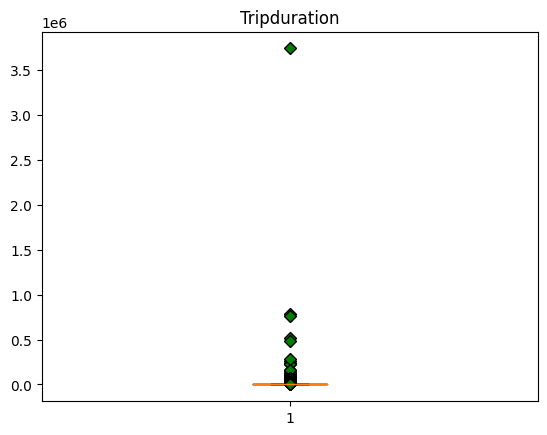

In [12]:
print("Check tripduration values for outliers")
green_diamond = dict(markerfacecolor='g', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Tripduration')
bp = ax1.boxplot(df_citibike['tripduration'], flierprops=green_diamond)
plt.show()

In [13]:
for key in bp:
    print(f'{key}: {[item.get_ydata() for item in bp[key]]}\n')

whiskers: [array([388.,  60.]), array([1050., 2043.])]

caps: [array([60, 60], dtype=int64), array([2043, 2043], dtype=int64)]

boxes: [array([ 388.,  388., 1050., 1050.,  388.])]

medians: [array([627., 627.])]

fliers: [array([6033, 2126, 2819, ..., 2630, 2199, 2175], dtype=int64)]

means: []



In [14]:
fliers = [item.get_ydata() for item in bp['fliers']]

q1 = [round(min(item.get_ydata()), 1) for item in bp['boxes']]

lower_outliers = []
upper_outliers = []

for i in range(len(fliers)):
    lower_outliers_by_box = []
    upper_outliers_by_box = []
    for outlier in fliers[i]:
        if outlier < q1[i]:
            lower_outliers_by_box.append(round(outlier, 1))
        else:
            upper_outliers_by_box.append(round(outlier, 1))

    # storing outliers
    lower_outliers.append(lower_outliers_by_box)
    upper_outliers.append(upper_outliers_by_box)

print(f'Lower outliers: {len(lower_outliers_by_box)}\n'
      f'Upper outliers: {len(upper_outliers_by_box)}')

Lower outliers: 0
Upper outliers: 4803


Finding a resonable tripduration limit:


NYC Area = 789,4 km²


d=root(4A/π)


In [15]:
# NYC Area
import math
nycArea = 789.4  # km²
# we assume that 15km/h is the average speed
speed = 15
dOfNYC = math.sqrt(4*nycArea/math.pi)*2
maxduration_sec = (dOfNYC / speed ) * 3600
print(f"Diameter of NYC: {dOfNYC} km")
print(f"We assume an average speed of {speed} km/h")
print(f"We conclude that a trip should not be longer than: {maxduration_sec} seconds.")

Diameter of NYC: 63.40647590314218 km
We assume an average speed of 15 km/h
We conclude that a trip should not be longer than: 15217.554216754124 seconds.


In [16]:
column_name = 'tripduration'

column = df_citibike[column_name]

count = column[column > maxduration_sec].count()

print(f"{count}")

204


In [17]:
df_citibike_clean = df_citibike[df_citibike.tripduration <= maxduration_sec]

highest birth_year in raw data: 1999
lowest birth_year in raw data: 1885
We assume that users born before 1950 provided a false date


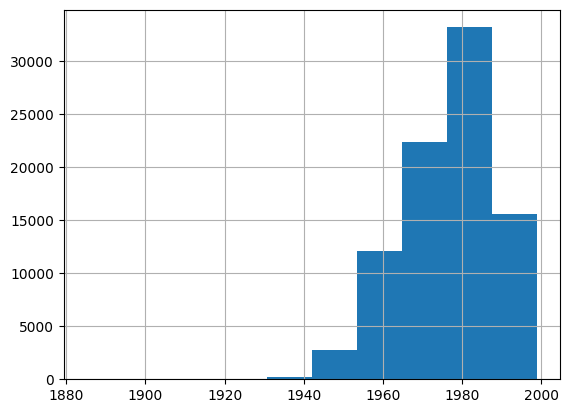

In [18]:
# check age of users
print(f"highest birth_year in raw data: {df_citibike.birth_year.max()}")
print(f"lowest birth_year in raw data: {df_citibike.birth_year.min()}")
df_citibike.birth_year.hist()
print(f"We assume that users born before 1950 provided a false date")

In [19]:
# replace birth_year < 1950 with NaN
df_citibike_clean.birth_year[df_citibike_clean.birth_year < 1950] = np.nan


C:\Users\relentne\AppData\Local\Temp\ipykernel_26764\3381151061.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_citibike_clean.birth_year[df_citibike_clean.birth_year < 1950] = np.nan
C:\Users\relentne\AppData\Local\Temp\ipykernel_26764\3381151061.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_citibike_clean.birth_year[df_citibike_clean.birth_year < 1950] = np.nan


highest birth_year in cleaned data: 1999
lowest birth_year in cleaned data: 1950


<AxesSubplot: >

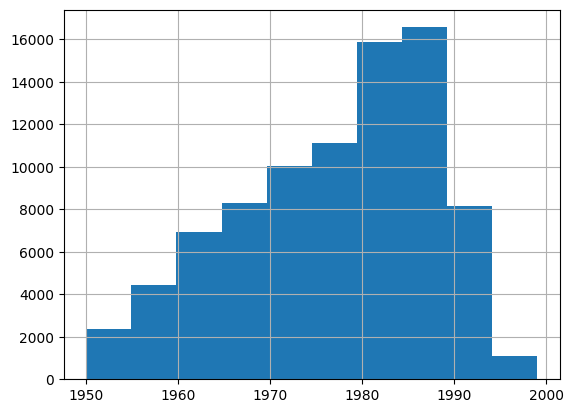

In [20]:
# check age of users (cleaned data)
print(f"highest birth_year in cleaned data: {df_citibike_clean.birth_year.max()}")
print(f"lowest birth_year in cleaned data: {df_citibike_clean.birth_year.min()}")
df_citibike_clean.birth_year.hist()

New Chart after Outlyers have been handled


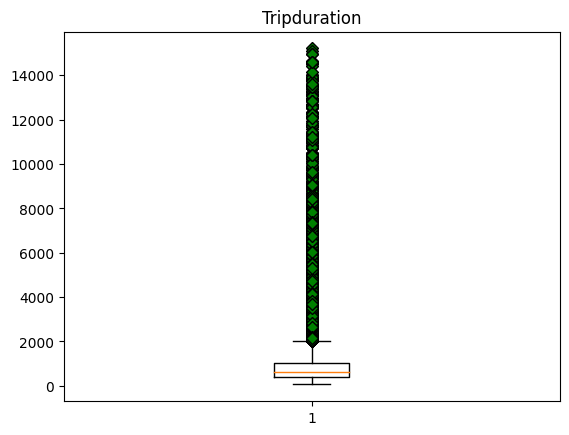

In [21]:
print("New Chart after Outlyers have been handled")
green_diamond = dict(markerfacecolor='g', marker='D')
fig2, ax2 = plt.subplots()
ax2.set_title('Tripduration')
bp = ax2.boxplot(df_citibike_clean['tripduration'], flierprops=green_diamond)
plt.show()

### Final Checks


In [22]:
print("Check for missing values in Citibike:")
df_citibike_clean.isna().sum()

Check for missing values in Citibike:


uniqueid                       0
tripduration                   0
starttime                      0
stoptime                       0
start_station_id               0
start_station_name             0
start_station_latitude         0
start_station_longitude        0
end_station_id                 0
end_station_name               0
end_station_latitude           0
end_station_longitude          0
bikeid                         0
usertype                       0
birth_year                 14291
gender                         0
Date                           0
dtype: int64

Since there are only values missing in the birth year, we decided to keep them in and use a later learned ml algorithm to try to guess the age (knn or other techniques)


In [23]:
print("Final Citibike DataFrame data types per column:")
print(f"{df_citibike_clean.dtypes}")

Final Citibike DataFrame data types per column:
uniqueid                            int64
tripduration                        int64
starttime                  datetime64[ns]
stoptime                   datetime64[ns]
start_station_id                 category
start_station_name                 object
start_station_latitude            float64
start_station_longitude           float64
end_station_id                   category
end_station_name                   object
end_station_latitude              float64
end_station_longitude             float64
bikeid                              int64
usertype                         category
birth_year                          Int64
gender                           category
Date                       datetime64[ns]
dtype: object


In [24]:
print("Final cleaned citibike dataset (first and last row):")
df_citibike_clean.iloc[[1, -1]]

Final cleaned citibike dataset (first and last row):


,uniqueid,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bikeid,usertype,birth_year,gender,Date
1,1043212,1542,2015-04-13 08:07:06,2015-04-13 08:32:48,545,E 23 St & 1 Ave,40.736502,-73.978095,415,Pearl St & Hanover Square,40.704718,-74.009260,19785,Subscriber,1957,male,2015-04-13
99379,8672150,418,2015-11-14 15:39:48,2015-11-14 15:46:46,317,E 6 St & Avenue B,40.724537,-73.981854,301,E 2 St & Avenue B,40.722174,-73.983688,19774,Subscriber,1961,male,2015-11-14


# ETL Weather dataset


In [25]:
print("Show first and last row of weather dataset:")
df_weather.iloc[[1, -1]]

Show first and last row of weather dataset:


,Unnamed: 0,Date,Max.TemperatureF,Mean.TemperatureF,Min.TemperatureF,Max.Dew.PointF,MeanDew.PointF,Min.DewpointF,Max.Humidity,Mean.Humidity,...,Min.VisibilityMiles,Max.Wind.SpeedMPH,Mean.Wind.SpeedMPH,Max.Gust.SpeedMPH,PrecipitationIn,CloudCover,Events,WindDirDegrees.br...,city,season
1,2,1948-07-02,82,72.0,63,62,53,49,76,51,...,10.0,16,10,NaN,0.00,0.0,NaN,315<br />,New York City (USA),Summer
24559,24627,2015-12-31,52,48.0,43,46,38,27,93,71,...,5.0,20,12,25.0,0.06,7.0,Rain,317<br />,New York City (USA),Winter


In [26]:
print("Weather DataFrame data types per column (auto import):")
print(f"{df_weather.dtypes}")

Weather DataFrame data types per column (auto import):
Unnamed: 0                     int64
Date                          object
Max.TemperatureF               int64
Mean.TemperatureF            float64
Min.TemperatureF               int64
Max.Dew.PointF                 int64
MeanDew.PointF                 int64
Min.DewpointF                  int64
Max.Humidity                   int64
Mean.Humidity                  int64
Min.Humidity                   int64
Max.Sea.Level.PressureIn     float64
Mean.Sea.Level.PressureIn    float64
Min.Sea.Level.PressureIn     float64
Max.VisibilityMiles          float64
Mean.VisibilityMiles         float64
Min.VisibilityMiles          float64
Max.Wind.SpeedMPH              int64
Mean.Wind.SpeedMPH             int64
Max.Gust.SpeedMPH            float64
PrecipitationIn               object
CloudCover                   float64
Events                        object
WindDirDegrees.br...          object
city                          object
season              

In [27]:
print("Rename columns to avoid whitespace and dot in the names")
df_weather.columns = df_weather.columns.str.replace(' ', '', regex=True)
df_weather.columns = df_weather.columns.str.replace('\.', '', regex=True)
df_weather.rename(columns={"Unnamed:0": "Id"}, inplace=True, errors="raise")

Rename columns to avoid whitespace and dot in the names


In [28]:
print("Convert column Date from object to datetime")
df_weather['Date'] = pd.to_datetime(df_weather['Date'], format='%Y-%m-%d')
df_weather["Date"].iloc[[0, -1]]

Convert column Date from object to datetime


0       1948-07-01
24559   2015-12-31
Name: Date, dtype: datetime64[ns]

In [29]:
print("Convert column PrecipitationIn from object to float")
df_weather['PrecipitationIn'] = pd.to_numeric(
    df_weather['PrecipitationIn'], errors='coerce')

Convert column PrecipitationIn from object to float


In [30]:
print("Convert column Events from object to string")
df_weather['Events'] = df_weather['Events'].astype('|S')
df_weather["Events"].iloc[[0, -1]]

Convert column Events from object to string


0         b'Fog'
24559    b'Rain'
Name: Events, dtype: bytes208

In [31]:
print("Show column WindDirDegreesbr (first and last rows)")
df_weather["WindDirDegreesbr"].iloc[[0, -1]]

Show column WindDirDegreesbr (first and last rows)


0        264<br />
24559    317<br />
Name: WindDirDegreesbr, dtype: object

In [32]:
print("Convert column WindDirDegreesbr from object to integer and remove the strings <br /> from each cell")

df_weather['WindDirectionDEG'] = df_weather['WindDirDegreesbr'].str.removesuffix(
    "<br />")
df_weather['WindDirectionDEG'] = df_weather['WindDirectionDEG'].astype('int')
df_weather["WindDirectionDEG"].iloc[[0, -1]]

Convert column WindDirDegreesbr from object to integer and remove the strings <br /> from each cell


0        264
24559    317
Name: WindDirectionDEG, dtype: int32

In [33]:
print("Converting Fahrenheit to Celsius")
def fahrenheit_to_celsius(fahrenheit):
    celsius = (fahrenheit - 32) * 5 / 9
    return celsius

df_weather["MaxTemperatureC"] = fahrenheit_to_celsius(
    df_weather["MaxTemperatureF"])
df_weather["MeanTemperatureC"] = fahrenheit_to_celsius(
    df_weather["MeanTemperatureF"])
df_weather["MinTemperatureC"] = fahrenheit_to_celsius(
    df_weather["MinTemperatureF"])
df_weather["MaxDewpointC"] = fahrenheit_to_celsius(
    df_weather["MaxDewPointF"])
df_weather["MeanDewpointC"] = fahrenheit_to_celsius(
    df_weather["MeanDewPointF"])
df_weather["MinDewpointC"] = fahrenheit_to_celsius(
    df_weather["MinDewpointF"])

print("Converting Miles to Kilometer")
def miles_to_km(miles):
    km = miles * 1.609344
    return km

df_weather["MinVisibilityKM"] = miles_to_km(df_weather["MinVisibilityMiles"])
df_weather["MaxVisibilityKM"] = miles_to_km(df_weather["MaxVisibilityMiles"])
df_weather["MeanVisibilityKM"] = miles_to_km(
    df_weather["MeanVisibilityMiles"])
df_weather["MaxWindSpeedKMH"] = miles_to_km(df_weather["MaxWindSpeedMPH"])
df_weather["MeanWindSpeedKMH"] = miles_to_km(
    df_weather["MeanWindSpeedMPH"])
df_weather["MaxGustSpeedKMH"] = miles_to_km(df_weather["MaxGustSpeedMPH"])

print("Converting inHg to hPa")
def inhg_to_hpa(inhg):
    hpa = inhg * 33.86389
    return hpa

df_weather["MaxSeaLevelPressureHPA"] = inhg_to_hpa(
    df_weather["MaxSeaLevelPressureIn"])
df_weather["MeanSeaLevelPressureHPA"] = inhg_to_hpa(
    df_weather["MeanSeaLevelPressureIn"])
df_weather["MinSeaLevelPressureHPA"] = inhg_to_hpa(
    df_weather["MinSeaLevelPressureIn"])

print("Converting CloudCover from eighths to percent")
def eighths_to_percent(eighths):
    percent = eighths / 8 * 100
    return percent

df_weather["CloudCoverPERCENT"] = eighths_to_percent(df_weather["CloudCover"])

print("Converting Inch to Millimeter")
def inch_to_mm(inch):
    mm = inch * 25.4
    return mm

df_weather["PrecipitationMM"] = inch_to_mm(
    df_weather["PrecipitationIn"].astype('float'))

Converting Fahrenheit to Celsius
Converting Miles to Kilometer
Converting inHg to hPa
Converting CloudCover from eighths to percent
Converting Inch to Millimeter


In [34]:
print("Drop not required columns after conversion")
df_weather.drop(['MaxTemperatureF', 'MeanTemperatureF', 'MinTemperatureF', 'MaxDewPointF', 'MeanDewPointF', 'MinDewpointF', 'MinVisibilityMiles', 'MaxVisibilityMiles', 'MeanVisibilityMiles', 'MaxWindSpeedMPH',
                'MeanWindSpeedMPH', 'MaxGustSpeedMPH', 'MaxSeaLevelPressureIn', 'MeanSeaLevelPressureIn', 'MinSeaLevelPressureIn', 'WindDirDegreesbr', 'PrecipitationIn', 'CloudCover'], axis=1, inplace=True)

Drop not required columns after conversion


In [35]:
print("Checking for categorial values in the columns")
for column in df_weather.columns:
    print(
        f"Column {column} has {df_weather[column].value_counts().count()} distinct values")

Checking for categorial values in the columns
Column Id has 24560 distinct values
Column Date has 24560 distinct values
Column MaxHumidity has 68 distinct values
Column MeanHumidity has 81 distinct values
Column MinHumidity has 91 distinct values
Column Events has 17 distinct values
Column city has 1 distinct values
Column season has 4 distinct values
Column WindDirectionDEG has 361 distinct values
Column MaxTemperatureC has 95 distinct values
Column MeanTemperatureC has 87 distinct values
Column MinTemperatureC has 82 distinct values
Column MaxDewpointC has 90 distinct values
Column MeanDewpointC has 93 distinct values
Column MinDewpointC has 99 distinct values
Column MinVisibilityKM has 13 distinct values
Column MaxVisibilityKM has 13 distinct values
Column MeanVisibilityKM has 21 distinct values
Column MaxWindSpeedKMH has 54 distinct values
Column MeanWindSpeedKMH has 38 distinct values
Column MaxGustSpeedKMH has 83 distinct values
Column MaxSeaLevelPressureHPA has 164 distinct valu

In [36]:
df_weather['season'].value_counts()

Summer    6364
Spring    6178
Autumn    6052
Winter    5966
Name: season, dtype: int64

In [37]:
df_weather['season'] = df_weather['season'].astype('category')

In [38]:
df_weather['Events'].value_counts().count()

17

In [39]:
df_weather['Events'].value_counts()

b'nan'                           12839
b'Rain'                           3514
b'Fog-Rain'                       3276
b'Fog'                            1937
b'Snow'                            694
b'Fog-Rain-Thunderstorm'           668
b'Rain-Thunderstorm'               648
b'Fog-Rain-Snow'                   378
b'Rain-Snow'                       288
b'Fog-Snow'                        274
b'Thunderstorm'                     19
b'Fog-Rain-Snow-Thunderstorm'       11
b'Fog-Thunderstorm'                  8
b'Rain-Snow-Thunderstorm'            3
b'Fog-Snow-Thunderstorm'             1
b'Fog-Rain-Hail-Thunderstorm'        1
b'Tornado'                           1
Name: Events, dtype: int64

In [40]:
print("The most frequent events are rain and fog-rain")

The most frequent events are rain and fog-rain


In [41]:
df_weather['city'].value_counts()

New York City (USA)    24560
Name: city, dtype: int64

In [42]:
print("All locations are New York City")

All locations are New York City


In [43]:
df_weather['city'] = df_weather['city'].astype('category')

In [44]:
df_weather['CloudCoverPERCENT'].value_counts()

0.0      6738
100.0    2200
75.0     2195
87.5     2157
62.5     2132
50.0     1987
37.5     1755
25.0     1498
12.5     1117
Name: CloudCoverPERCENT, dtype: int64

Show distribution of Cloud Cover


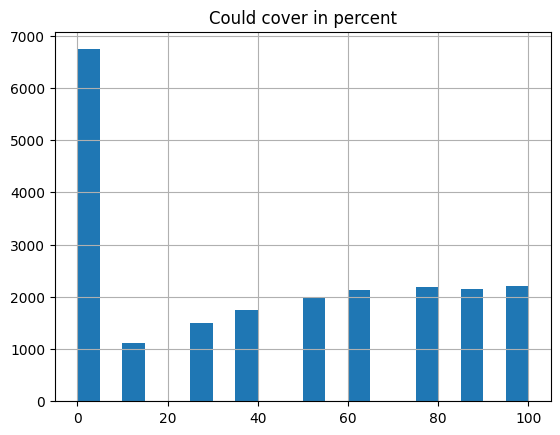

Most of the time it is a clear sky!


In [45]:
print("Show distribution of Cloud Cover")
plt.title('Could cover in percent')
df_weather['CloudCoverPERCENT'].hist(bins=20, range=[0, 100])
plt.show()
print("Most of the time it is a clear sky!")

In [46]:
df_weather['CloudCoverPERCENT'] = df_weather['CloudCoverPERCENT'].astype(
    'category')

Check temperature values for outliers


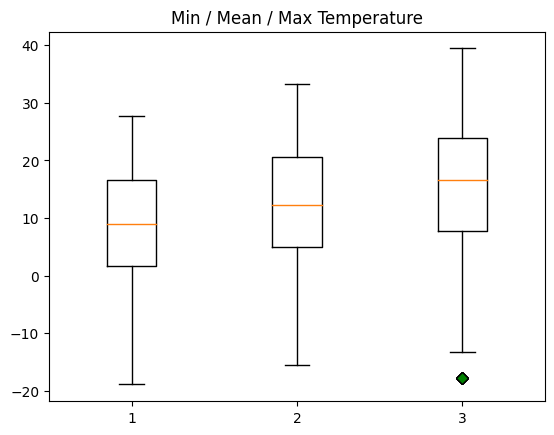

In [47]:
print("Check temperature values for outliers")
green_diamond = dict(markerfacecolor='g', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Min / Mean / Max Temperature')
ax1.boxplot([df_weather['MinTemperatureC'], df_weather['MeanTemperatureC'].dropna(
), df_weather['MaxTemperatureC']], flierprops=green_diamond)
plt.show()

Check visibility values for outliers


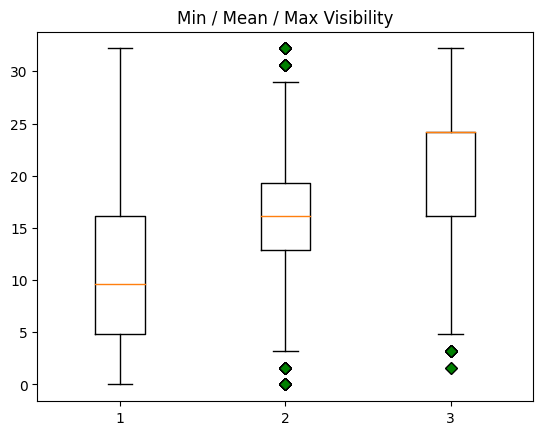

In [48]:
print("Check visibility values for outliers")
green_diamond = dict(markerfacecolor='g', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Min / Mean / Max Visibility')
ax1.boxplot([df_weather['MinVisibilityKM'].dropna(), df_weather['MeanVisibilityKM'].dropna(
), df_weather['MaxVisibilityKM'].dropna()], flierprops=green_diamond)
plt.show()

Check humidity values for outliers


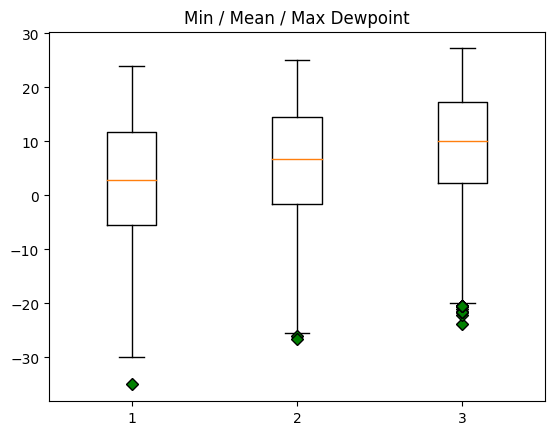

In [49]:
print("Check humidity values for outliers")
green_diamond = dict(markerfacecolor='g', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Min / Mean / Max Dewpoint')
ax1.boxplot([df_weather['MinDewpointC'], df_weather['MeanDewpointC'].dropna(
), df_weather['MaxDewpointC']], flierprops=green_diamond)
plt.show()

Check wind speed for outliers


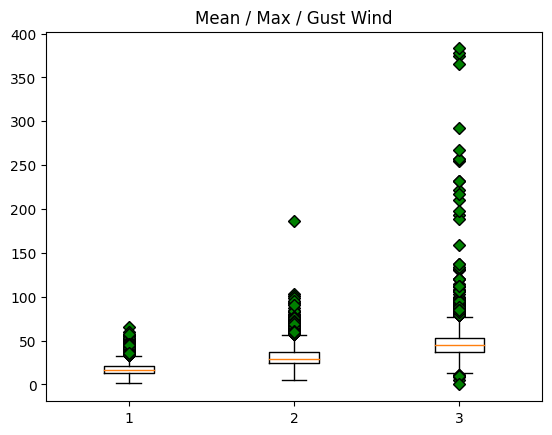

We see very high wind speeds (gusts) up to 375 km/h, which seems too high


In [50]:
print("Check wind speed for outliers")
green_diamond = dict(markerfacecolor='g', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Mean / Max / Gust Wind')
ax1.boxplot([df_weather['MeanWindSpeedKMH'].dropna(), df_weather['MaxWindSpeedKMH'].dropna(
), df_weather['MaxGustSpeedKMH'].dropna()], flierprops=green_diamond)
plt.show()
print("We see very high wind speeds (gusts) up to 375 km/h, which seems too high")

In [51]:
print("Show rows with MaxWind stronger than 100 km/h")
df_weather[df_weather.MaxWindSpeedKMH > 100]

Show rows with MaxWind stronger than 100 km/h


,Id,Date,MaxHumidity,MeanHumidity,MinHumidity,Events,city,season,WindDirectionDEG,MaxTemperatureC,...,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM
877,880,1950-11-25,100,89,76,b'Fog-Rain',New York City (USA),Autumn,111,15.000000,...,16.09344,9.656064,102.998016,65.983104,NaN,1018.287172,1003.387061,990.180144,0.0,0.0
9210,9236,1973-09-18,97,81,55,b'Fog-Rain',New York City (USA),Summer,212,23.888889,...,24.14016,14.484096,101.388672,22.530816,NaN,1020.657645,1013.207589,1008.805283,75.0,12.7
23910,23977,2014-03-22,76,49,22,b'nan',New York City (USA),Spring,266,18.333333,...,16.09344,16.093440,186.683904,22.530816,292.900608,1017.948533,1012.530311,1008.128005,50.0,0.0


In [52]:
print("Show rows with GustWind stronger than 200 km/h")
df_weather[df_weather.MaxGustSpeedKMH > 200]

Show rows with GustWind stronger than 200 km/h


,Id,Date,MaxHumidity,MeanHumidity,MinHumidity,Events,city,season,WindDirectionDEG,MaxTemperatureC,...,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM
21120,21179,2006-08-01,87,67,46,b'nan',New York City (USA),Summer,235,36.111111,...,16.09344,11.265408,35.405568,17.702784,254.276352,1013.207589,1012.191672,1011.175755,25.0,0.000
21146,21205,2006-08-27,93,75,57,b'Rain',New York City (USA),Summer,128,23.333333,...,16.09344,14.484096,37.014912,22.530816,374.977152,1024.382672,1020.319006,1015.578061,100.0,5.842
21158,21217,2006-09-08,87,71,54,b'nan',New York City (USA),Summer,217,26.666667,...,16.09344,14.484096,28.968192,14.484096,231.745536,1019.980367,1018.625811,1017.271256,50.0,0.000
21165,21224,2006-09-15,93,90,87,b'Rain-Thunderstorm',New York City (USA),Summer,49,20.000000,...,16.09344,11.265408,41.842944,16.093440,257.495040,1017.948533,1016.255339,1014.562144,100.0,23.622
21245,21304,2006-12-04,70,51,32,b'nan',New York City (USA),Autumn,302,6.111111,...,16.09344,16.093440,46.670976,24.140160,378.195840,1022.350839,1019.641728,1016.593978,50.0,NaN
21375,21435,2007-04-13,82,60,38,b'nan',New York City (USA),Spring,283,11.111111,...,16.09344,16.093440,56.327040,32.186880,210.824064,1015.578061,1010.837116,1007.112089,62.5,0.000
21376,21436,2007-04-14,70,50,30,b'nan',New York City (USA),Spring,270,13.333333,...,16.09344,16.093440,41.842944,20.921472,257.495040,1017.609894,1015.916700,1014.562144,62.5,NaN
21427,21487,2007-06-04,93,82,70,b'Rain-Thunderstorm',New York City (USA),Spring,5,21.666667,...,16.09344,9.656064,45.061632,19.312128,383.023872,1002.032505,996.952922,994.921088,87.5,44.958
21433,21493,2007-06-10,84,64,44,b'nan',New York City (USA),Spring,52,22.777778,...,16.09344,14.484096,19.312128,9.656064,222.089472,1017.609894,1016.932617,1014.900783,87.5,NaN
21985,22046,2008-12-13,54,45,35,b'nan',New York City (USA),Autumn,331,1.111111,...,16.09344,16.093440,41.842944,22.530816,267.151104,1033.187284,1026.753145,1017.271256,37.5,0.000


Check wind direction for outliers


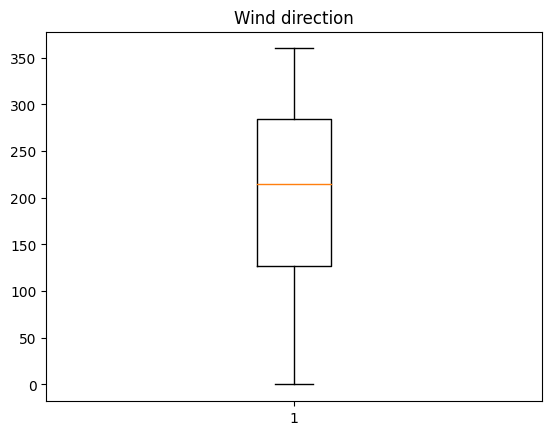

The predominant wind direction is 210° (wind from south-west)


In [53]:
print("Check wind direction for outliers")
green_diamond = dict(markerfacecolor='g', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Wind direction')
ax1.boxplot(df_weather['WindDirectionDEG'].dropna(), flierprops=green_diamond)
plt.show()
print("The predominant wind direction is 210° (wind from south-west)")

Show distribution of wind direction


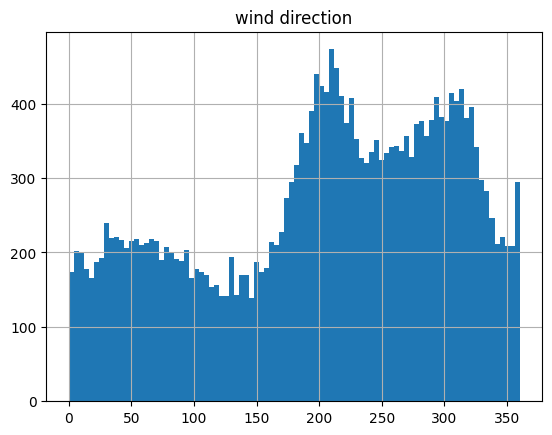

The predominant wind directions are between 200° and 320° (winds from south-west to north-west)


In [54]:
print("Show distribution of wind direction")
plt.title('wind direction')
df_weather['WindDirectionDEG'].hist(bins=90, range=[0, 360])
plt.show()
print("The predominant wind directions are between 200° and 320° (winds from south-west to north-west)")

In [55]:
print("Weather data types after cleaning, renaming and conversion:")
print(f"{df_weather.dtypes}")

Weather data types after cleaning, renaming and conversion:
Id                                  int64
Date                       datetime64[ns]
MaxHumidity                         int64
MeanHumidity                        int64
MinHumidity                         int64
Events                               |S26
city                             category
season                           category
WindDirectionDEG                    int32
MaxTemperatureC                   float64
MeanTemperatureC                  float64
MinTemperatureC                   float64
MaxDewpointC                      float64
MeanDewpointC                     float64
MinDewpointC                      float64
MinVisibilityKM                   float64
MaxVisibilityKM                   float64
MeanVisibilityKM                  float64
MaxWindSpeedKMH                   float64
MeanWindSpeedKMH                  float64
MaxGustSpeedKMH                   float64
MaxSeaLevelPressureHPA            float64
MeanSeaLevelPres

In [56]:
print("Check for missing values in Weather:")
df_weather.isna().sum()

Check for missing values in Weather:


Id                             0
Date                           0
MaxHumidity                    0
MeanHumidity                   0
MinHumidity                    0
Events                         0
city                           0
season                         0
WindDirectionDEG               0
MaxTemperatureC                0
MeanTemperatureC               2
MinTemperatureC                0
MaxDewpointC                   0
MeanDewpointC                  0
MinDewpointC                   0
MinVisibilityKM               15
MaxVisibilityKM               15
MeanVisibilityKM              15
MaxWindSpeedKMH                0
MeanWindSpeedKMH               0
MaxGustSpeedKMH            15538
MaxSeaLevelPressureHPA         0
MeanSeaLevelPressureHPA        0
MinSeaLevelPressureHPA         0
CloudCoverPERCENT           2781
PrecipitationMM              525
dtype: int64

In [57]:
print(f"Show first and last rows of Weather - after cleaning and conversion:")
df_weather.iloc[[0, -1]]

Show first and last rows of Weather - after cleaning and conversion:


,Id,Date,MaxHumidity,MeanHumidity,MinHumidity,Events,city,season,WindDirectionDEG,MaxTemperatureC,...,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM
0,1,1948-07-01,93,65,46,b'Fog',New York City (USA),Summer,264,28.888889,...,16.09344,11.265408,25.749504,12.874752,NaN,1018.287172,1016.255339,1015.239422,0.0,0.000
24559,24627,2015-12-31,93,71,49,b'Rain',New York City (USA),Winter,317,11.111111,...,16.09344,16.093440,32.186880,19.312128,40.2336,1019.303089,1017.948533,1016.255339,87.5,1.524


# Joining the datasets


In [58]:
df_citibike_weather = pd.merge(
    df_citibike_clean, df_weather, how="left", on="Date")
df_citibike_weather.iloc[[1, -1]]

,uniqueid,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,...,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM
1,1043212,1542,2015-04-13 08:07:06,2015-04-13 08:32:48,545,E 23 St & 1 Ave,40.736502,-73.978095,415,Pearl St & Hanover Square,...,16.09344,16.09344,46.670976,22.530816,61.155072,1029.462256,1025.737228,1022.350839,62.5,0.0
99175,8672150,418,2015-11-14 15:39:48,2015-11-14 15:46:46,317,E 6 St & Avenue B,40.724537,-73.981854,301,E 2 St & Avenue B,...,16.09344,16.09344,46.670976,28.968192,61.155072,1025.398589,1018.287172,1011.175755,25.0,0.0


In [59]:
print(f"Rowcount of citibike dataset: {len(df_citibike_clean)} elements")
print(f"Rowcount of weather dataset: {len(df_weather)} elements")
print(f"Rowcount of joined dataset: {len(df_citibike_weather)} elements\n")

print(
    f"Columncount of citibike dataset: {len(df_citibike_clean.columns)} elements")
print(f"Columncount of weather dataset: {len(df_weather.columns)} elements")
print(
    f"Columncount of joined dataset: {len(df_citibike_weather.columns)} elements")


Rowcount of citibike dataset: 99176 elements
Rowcount of weather dataset: 24560 elements
Rowcount of joined dataset: 99176 elements

Columncount of citibike dataset: 17 elements
Columncount of weather dataset: 26 elements
Columncount of joined dataset: 42 elements


Everything seems fine with the joined dataframe. The Rowcount matches (since we did a left join) and the Columncount matches as well (17 + 26 = 43. Subtract one because of the duplicate Date column -> 42)


# Visualisation final dataset


In [60]:
pd.set_option("display.max_columns", None)

In [61]:
df_citibike_weather.iloc[[1, -1]]

,uniqueid,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bikeid,usertype,birth_year,gender,Date,Id,MaxHumidity,MeanHumidity,MinHumidity,Events,city,season,WindDirectionDEG,MaxTemperatureC,MeanTemperatureC,MinTemperatureC,MaxDewpointC,MeanDewpointC,MinDewpointC,MinVisibilityKM,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM
1,1043212,1542,2015-04-13 08:07:06,2015-04-13 08:32:48,545,E 23 St & 1 Ave,40.736502,-73.978095,415,Pearl St & Hanover Square,40.704718,-74.009260,19785,Subscriber,1957,male,2015-04-13,24365,83,65,47,b'nan',New York City (USA),Spring,185,16.666667,11.666667,6.111111,7.777778,4.444444,1.666667,16.09344,16.09344,16.09344,46.670976,22.530816,61.155072,1029.462256,1025.737228,1022.350839,62.5,0.0
99175,8672150,418,2015-11-14 15:39:48,2015-11-14 15:46:46,317,E 6 St & Avenue B,40.724537,-73.981854,301,E 2 St & Avenue B,40.722174,-73.983688,19774,Subscriber,1961,male,2015-11-14,24580,49,40,30,b'nan',New York City (USA),Autumn,299,10.555556,8.333333,5.555556,-1.666667,-4.444444,-6.111111,16.09344,16.09344,16.09344,46.670976,28.968192,61.155072,1025.398589,1018.287172,1011.175755,25.0,0.0


In [194]:
print("Number of trips that started and ended per station, grouped per weekday.")
print("Column 'bike_diff' shows how many bikes were removed/added from a station per weekday (accumulated) by user trips.")
df_citibike_weather['weekday'] = df_citibike_weather['starttime'].dt.dayofweek
df_t_start_wd = df_citibike_weather.groupby(['start_station_id', 'weekday']).size().reset_index(name="nb_start")
df_t_end_wd   = df_citibike_weather.groupby(['end_station_id',   'weekday']).size().reset_index(name="nb_end")
df_t_start_wd.rename(columns={"start_station_id": "station_id"}, inplace=True, errors="raise")
df_t_end_wd.rename(columns={"end_station_id": "station_id"}, inplace=True, errors="raise")
df_t_start_end_wd = pd.merge(df_t_start_wd, df_t_end_wd, how="inner", on=["station_id", "weekday"])
df_t_start_end_wd['bike_diff'] = df_t_start_end_wd.apply(lambda row: row.nb_end - row.nb_start, axis=1)
df_t_start_end_wd.sort_values(['bike_diff'], ascending=[False])

Number of trips that started and ended per station, grouped per weekday.
Column 'bike_diff' shows how many bikes were removed/added from a station per weekday (accumulated) by user trips.


,station_id,weekday,nb_start,nb_end,bike_diff
1432,426,4,89,144,55
1872,492,3,65,114,49
822,329,3,37,79,42
1764,477,0,101,142,41
1303,405,1,59,96,37
...,...,...,...,...,...
2037,517,0,94,52,-42
2065,521,0,182,137,-45
2066,521,1,183,136,-47
2067,521,2,207,151,-56


In [193]:
print("Number of trips that started and ended per station, grouped per day.")
print("Column 'bike_diff' shows how many bikes were removed/added from a station on a specific day by user trips.")
df_t_start = df_citibike_weather.groupby(['start_station_id', 'Date']).size().reset_index(name="nb_start")
df_t_end   = df_citibike_weather.groupby(['end_station_id',   'Date']).size().reset_index(name="nb_end")
df_t_start.rename(columns={"start_station_id": "station_id"}, inplace=True, errors="raise")
df_t_end.rename(columns={"end_station_id": "station_id"}, inplace=True, errors="raise")
df_t_start_end = pd.merge(df_t_start, df_t_end, how="inner", on=["station_id", "Date"])
df_t_start_end['bike_diff'] = df_t_start_end.apply(lambda row: row.nb_end - row.nb_start, axis=1)
#df_t_start_end.sort_values(['nb_start', 'nb_end'], ascending=[True, False]).iloc[:20]
df_t_start_end.sort_values(['bike_diff'], ascending=[False])

Number of trips that started and ended per station, grouped per day.
Column 'bike_diff' shows how many bikes were removed/added from a station on a specific day by user trips.


,station_id,Date,nb_start,nb_end,bike_diff
52728,358,2015-06-18,0,11,11
121029,3002,2015-08-03,0,10,10
107072,519,2015-05-08,2,12,10
107959,521,2015-10-12,0,9,9
165592,3165,2015-09-05,2,11,9
...,...,...,...,...,...
28797,285,2015-11-24,9,1,-8
59084,379,2015-11-16,9,1,-8
107910,521,2015-08-24,12,3,-9
107884,521,2015-07-29,12,2,-10


In [160]:
print("Number of trips and mean trip duration per start station:")
df_t_s = df_citibike_weather.groupby(
    df_citibike_weather['start_station_id']).size().reset_index(name="nbtrips")
df_td_s = df_citibike_weather.groupby(df_citibike_weather['start_station_id'])[
    'tripduration'].mean().reset_index(name="tripduration")
df_t_td_s = pd.merge(df_t_s, df_td_s, how="inner", on="start_station_id")
df_t_td_s
#df_td_s

Number of trips and mean trip duration per start station:


,start_station_id,nbtrips,tripduration
0,72,299,1010.113712
1,79,213,936.596244
2,82,107,870.401869
3,83,110,959.636364
4,116,480,613.362500
...,...,...,...
480,3234,68,779.382353
481,3235,59,639.169492
482,3236,52,691.807692
483,3237,2,713.000000


In [63]:
# add new column starthour
df_citibike_weather['starthour'] = df_citibike_weather['starttime'].dt.hour
df_citibike_weather

,uniqueid,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bikeid,usertype,birth_year,gender,Date,Id,MaxHumidity,MeanHumidity,MinHumidity,Events,city,season,WindDirectionDEG,MaxTemperatureC,MeanTemperatureC,MinTemperatureC,MaxDewpointC,MeanDewpointC,MinDewpointC,MinVisibilityKM,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM,starthour
0,2018212,146,2015-05-18 13:39:47,2015-05-18 13:42:14,335,Washington Pl & Broadway,40.729039,-73.994046,439,E 4 St & 2 Ave,40.726281,-73.989780,15313,Subscriber,1973,male,2015-05-18,24400,90,81,72,b'nan',New York City (USA),Spring,89,20.000000,17.222222,13.888889,17.222222,12.777778,10.555556,0.000000,16.09344,11.265408,33.796224,16.093440,37.014912,1023.366756,1020.996283,1018.964450,87.5,0.000,13
1,1043212,1542,2015-04-13 08:07:06,2015-04-13 08:32:48,545,E 23 St & 1 Ave,40.736502,-73.978095,415,Pearl St & Hanover Square,40.704718,-74.009260,19785,Subscriber,1957,male,2015-04-13,24365,83,65,47,b'nan',New York City (USA),Spring,185,16.666667,11.666667,6.111111,7.777778,4.444444,1.666667,16.093440,16.09344,16.093440,46.670976,22.530816,61.155072,1029.462256,1025.737228,1022.350839,62.5,0.000,8
2,1435683,6033,2015-04-29 17:11:02,2015-04-29 18:51:35,466,W 25 St & 6 Ave,40.743954,-73.991449,466,W 25 St & 6 Ave,40.743954,-73.991449,19157,Subscriber,1963,male,2015-04-29,24381,77,51,25,b'nan',New York City (USA),Spring,304,25.000000,17.777778,10.000000,6.666667,4.444444,1.111111,16.093440,16.09344,16.093440,28.968192,19.312128,38.624256,1007.789366,1005.757533,1003.725700,25.0,0.000,17
3,8250156,1414,2015-11-03 16:06:02,2015-11-03 16:29:37,401,Allen St & Rivington St,40.720196,-73.989978,459,W 20 St & 11 Ave,40.746745,-74.007756,18787,Subscriber,1973,male,2015-11-03,24569,89,64,39,b'nan',New York City (USA),Autumn,227,21.111111,14.444444,7.222222,12.222222,8.888889,6.111111,14.484096,16.09344,16.093440,20.921472,6.437376,24.140160,1024.721311,1022.350839,1020.319006,0.0,0.000,16
4,5393550,757,2015-08-25 17:30:52,2015-08-25 17:43:29,2023,E 55 St & Lexington Ave,40.759681,-73.970314,533,Broadway & W 39 St,40.752996,-73.987216,14819,Subscriber,1968,male,2015-08-25,24499,85,61,36,b'nan',New York City (USA),Summer,206,29.444444,26.666667,23.888889,22.777778,20.000000,9.444444,16.093440,16.09344,16.093440,32.186880,17.702784,38.624256,1012.868950,1011.175755,1010.159839,50.0,0.254,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99171,1663859,720,2015-05-07 10:46:58,2015-05-07 10:58:58,496,E 16 St & 5 Ave,40.737262,-73.992390,453,W 22 St & 8 Ave,40.744751,-73.999154,16620,Subscriber,1959,female,2015-05-07,24389,93,65,37,b'nan',New York City (USA),Spring,183,22.222222,16.666667,10.555556,11.111111,8.333333,5.000000,1.609344,16.09344,12.874752,20.921472,9.656064,24.140160,1024.382672,1022.689478,1021.334922,37.5,0.000,10
99172,6855750,1153,2015-09-29 08:47:37,2015-09-29 09:06:51,400,Pitt St & Stanton St,40.719261,-73.981780,466,W 25 St & 6 Ave,40.743954,-73.991449,14665,Subscriber,1982,male,2015-09-29,24534,97,86,74,b'Rain',New York City (USA),Autumn,126,26.666667,23.888889,20.555556,22.222222,21.111111,18.888889,3.218688,16.09344,12.874752,27.358848,11.265408,35.405568,1020.319006,1016.932617,1011.853033,87.5,3.302,8
99173,9311608,1098,2015-12-19 08:58:44,2015-12-19 09:17:02,312,Allen St & E Houston St,40.722055,-73.989111,253,W 13 St & 5 Ave,40.735439,-73.994539,18690,Subscriber,1993,female,2015-12-19,24615,50,44,37,b'nan',New York City (USA),Autumn,272,5.000000,3.888889,2.222222,-5.000000,-8.333333,-9.444444,16.093440,16.09344,16.093440,48.280320,32.186880,62.764416,1026.075867,1018.964450,1011.175755,62.5,

In [64]:
print("Tripduration per hour:")
df_td_h = df_citibike_weather.groupby('starthour')['tripduration'].mean().astype(int).sort_values(ascending=False).to_frame().reset_index()
df_td_h


Tripduration per hour:


,starthour,tripduration
0,11,966
1,14,956
2,15,939
3,13,929
4,12,915
5,16,890
6,4,861
7,10,857
8,17,837
9,18,832


Shortest trips start at 5 AM


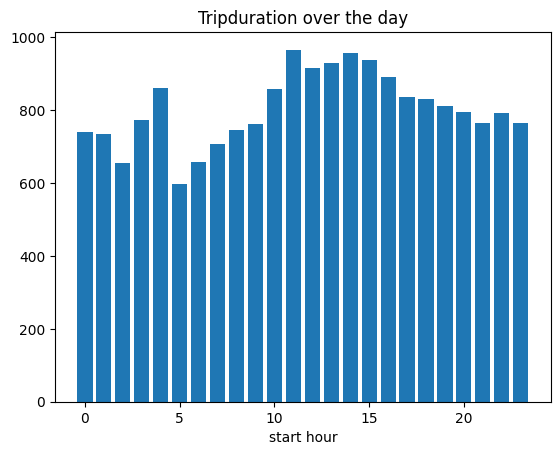

In [65]:
plt.title('Tripduration over the day')
plt.bar(df_td_h['starthour'], df_td_h['tripduration'])
plt.xlabel("start hour")
plt.show
print("Shortest trips start at 5 AM")

In [66]:
print("Mean triplength per station:")
df_td_s = df_citibike_weather.groupby('start_station_id')['tripduration'].mean(
).astype(int).sort_values(ascending=False).to_frame('tripduration').reset_index()
df_td_s

Mean triplength per station:


,start_station_id,tripduration
0,3181,2542
1,2006,2248
2,3016,2032
3,3052,1873
4,3182,1764
...,...,...
480,3048,435
481,3114,426
482,3070,322
483,3059,246


The stations with id numbers 3xxx show the longest trip durations


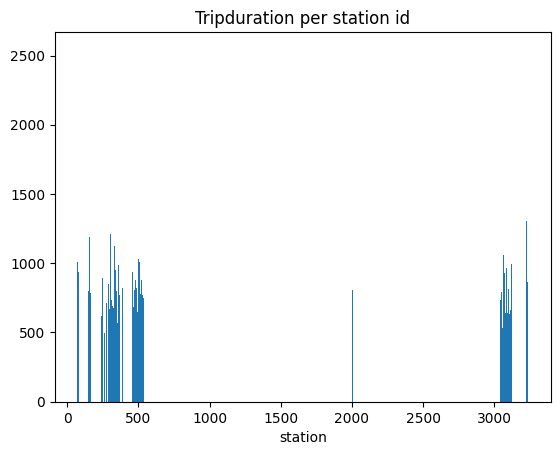

In [67]:
plt.title('Tripduration per station id')
plt.bar(df_td_s['start_station_id'], df_td_s['tripduration'])
plt.xlabel("station")
plt.show
print("The stations with id numbers 3xxx show the longest trip durations")

In [68]:
print("Mean triplength per weekday:")
# add column weekday
df_citibike_weather['weekday'] = df_citibike_weather['Date'].dt.day_name()
df_td_wd = df_citibike_weather.groupby('weekday')['tripduration'].mean().astype(
    int).sort_values(ascending=False).to_frame('tripduration').reset_index()
df_td_wd


Mean triplength per weekday:


,weekday,tripduration
0,Sunday,986
1,Saturday,972
2,Friday,813
3,Monday,806
4,Thursday,792
5,Wednesday,783
6,Tuesday,771


Longest trips are on weekends


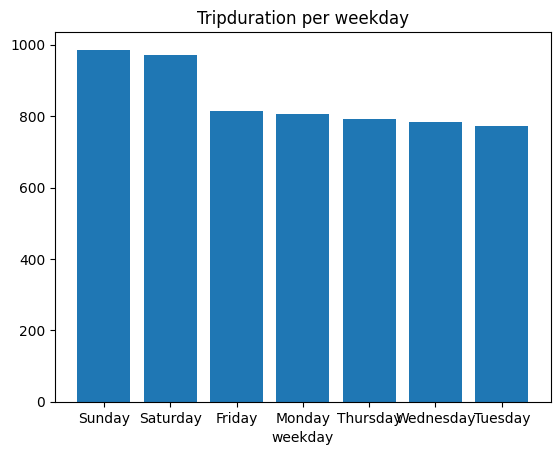

In [69]:
plt.title('Tripduration per weekday')
plt.bar(df_td_wd['weekday'], df_td_wd['tripduration'])
plt.xlabel("weekday")
plt.show
print("Longest trips are on weekends")

In [70]:
print("Total sum of trips per season:")
df_t_seas_sum = df_citibike_weather.groupby(
    'season')['Id'].size().sort_values(ascending=False).to_frame('trips').reset_index()
df_t_seas_sum

Total sum of trips per season:


,season,trips
0,Summer,34963
1,Autumn,31867
2,Spring,23617
3,Winter,8729


During summer there are 4 times more trips compared to winter


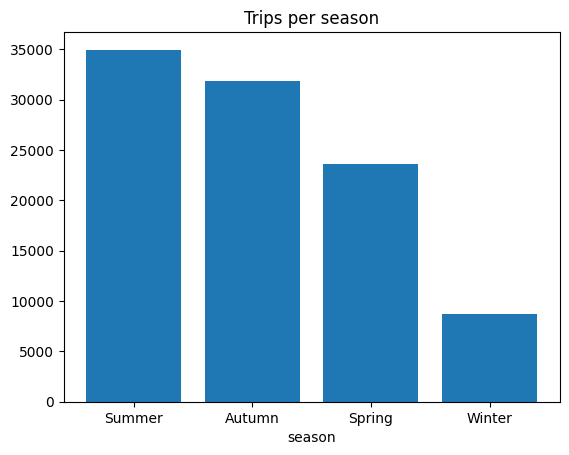

In [71]:
plt.title('Trips per season')
plt.bar(df_t_seas_sum['season'], df_t_seas_sum['trips'])
plt.xlabel("season")
plt.show
print("During summer there are 4 times more trips compared to winter")

In [72]:
print("Total sum of trips per weekday:")
df_t_wd_sum = df_citibike_weather.groupby(
    'weekday')['Id'].size().sort_values(ascending=True).to_frame('trips').reset_index()
df_t_wd_sum

Total sum of trips per weekday:


,weekday,trips
0,Sunday,11472
1,Saturday,11675
2,Monday,14800
3,Thursday,15100
4,Tuesday,15112
5,Friday,15183
6,Wednesday,15834


Most trips are on Wednesdays


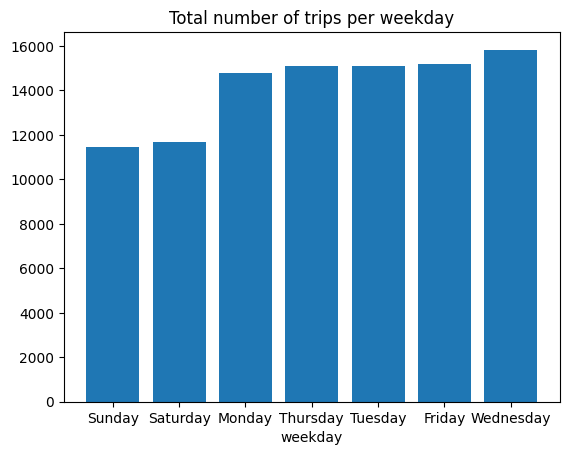

In [73]:
plt.title('Total number of trips per weekday')
plt.bar(df_t_wd_sum['weekday'], df_t_wd_sum['trips'])
plt.xlabel("weekday")
plt.show
print("Most trips are on Wednesdays")

In [74]:
px.scatter(df_citibike_weather, x="tripduration",
           y="MeanTemperatureC", color="season")

In [75]:
tmp = df_citibike_weather.groupby(["season", "gender"]).count().reset_index()
px.bar(tmp, x="season", y="uniqueid", color="gender", color_discrete_map={'female': '#f25e70',
                                                                          'male': '#73c0f0',
                                                                          'unknown': '#8ff296'})


In [76]:
fig_1 = make_subplots(rows=1, cols=2, specs=[
                      [{'type': 'domain'}, {'type': 'domain'}]])

labels = df_citibike_weather.loc[df_citibike_weather['season']
                                 == "Summer"]["gender"].value_counts().index
values = df_citibike_weather.loc[df_citibike_weather['season']
                                 == "Summer"]["gender"].value_counts().values
fig_1.add_trace(go.Pie(labels=labels, values=values), row=1, col=1)

labels = df_citibike_weather.loc[df_citibike_weather['season']
                                 == "Winter"]["gender"].value_counts().index
values = df_citibike_weather.loc[df_citibike_weather['season']
                                 == "Winter"]["gender"].value_counts().values
fig_1.add_trace(go.Pie(labels=labels, values=values), row=1, col=2)

fig_1.update_traces(hole=.4, hoverinfo="label+percent+name")
fig_1.update_traces(marker=dict(colors=['#f25e70', '#8ff296', '#73c0f0']))

fig_1.update_layout(
    title_text="Usage of Bikes per gender in Winter and Summer",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Summer', x=0.175, y=0.5, font_size=20, showarrow=False),
                 dict(text='Winter', x=0.82, y=0.5, font_size=20, showarrow=False)])

fig_1.show()


In [77]:
### Superseded by the next graph ###

df_citibike_weather_grouped = df_citibike_weather.groupby(
    ["birth_year", "season"]).count().reset_index()

# fig_2 = go.Figure(go.Heatmap(x = df_citibike_weather_grouped["season"], y = df_citibike_weather_grouped["birth_year"], z = df_citibike_weather_grouped["tripduration"], type = "heatmap", colorscale = "Blues"))
# # fig_2.update_yaxes(categoryorder="array", categoryarray=["<15" ,"15-20", "20-25", "25-30", "30-35", "35-40", "40-45", ">=45"][::-1])
# fig_2.update_layout(
#     title_text = 'Age Demographic per birth year and season',
# )
# fig_2.show()


In [78]:
fig_dropdown = go.Figure()
fig_dropdown.add_trace(go.Heatmap(x=df_citibike_weather_grouped["season"], y=df_citibike_weather_grouped[
                       "birth_year"], z=df_citibike_weather_grouped["tripduration"], type="heatmap", colorscale="Reds"))

# Add dropdowns
button_layer_1_height = 1.08
fig_dropdown.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["colorscale", "Reds"],
                    label="Reds",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Blues"],
                    label="Blues",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Viridis"],
                    label="Viridis",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Cividis"],
                    label="Cividis",
                    method="restyle"
                ),
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(
                    args=["reversescale", False],
                    label="False",
                    method="restyle"
                ),
                dict(
                    args=["reversescale", True],
                    label="True",
                    method="restyle"
                )
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.37,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(
                    args=[{"type": "heatmap"}],
                    label="Heatmap",
                    method="restyle"
                ),
                dict(
                    args=[{"contours.showlines": True, "type": "contour"}],
                    label="Hide lines",
                    method="restyle"
                ),
                dict(
                    args=[{"contours.showlines": False, "type": "contour"}],
                    label="Show lines",
                    method="restyle"
                ),
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.58,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
    ]
)

# Update plot sizing
fig_dropdown.update_layout(
    width=1000,
    height=800,
    autosize=False,
    margin=dict(t=150, b=0, l=0, r=0),
)

fig_dropdown.update_layout(
    annotations=[
        dict(text="colorscale", x=0, xref="paper", y=1.06, yref="paper",
             align="left", showarrow=False),
        dict(text="Reverse<br>Colorscale", x=0.25, xref="paper", y=1.07,
             yref="paper", showarrow=False),
        dict(text="Lines", x=0.54, xref="paper", y=1.06, yref="paper",
             showarrow=False)
    ])

fig_dropdown.update_xaxes(categoryorder="array", categoryarray=[
                          "Spring", "Summer", "Autumn", "Winter"])
fig_dropdown.update_layout(
    title_text='Tripduration by birth year (y axis) and season (x axis)',
)

fig_dropdown.show()


In [79]:
# read the neighborhood population data into a DataFrame and load the GeoJSON data
df_population = pd.read_csv(
    'data/New_York_City_Population_By_Neighborhood_Tabulation_Areas.csv')
df_population.iloc[[1, -1]]


,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
389,Staten Island,2010,85,SI99,park-cemetery-etc-Staten Island,0


In [80]:
print("Rename columns to avoid whitespace in the names")
df_population.columns = df_population.columns.str.replace('\s', '', regex=True)
df_population.iloc[[1, -1]]


Rename columns to avoid whitespace in the names


,Borough,Year,FIPSCountyCode,NTACode,NTAName,Population
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
389,Staten Island,2010,85,SI99,park-cemetery-etc-Staten Island,0


In [81]:
# read the NYC neighborhoods GeoJSON data
nycmap = json.load(open("data/nyc_neighborhoods.geojson"))


# call Plotly Express choropleth function to visualize data
fig = px.choropleth_mapbox(df_population,
                           geojson=nycmap,
                           locations="NTACode",
                           featureidkey="properties.ntacode",
                           color="Population",
                           color_continuous_scale="viridis",
                           mapbox_style="carto-positron",
                           zoom=10, center={"lat": 40.75, "lon": -73.96},
                           opacity=0.5,
                           width=800,
                           hover_name="NTAName",
                           hover_data=["NTAName", "Population"]
                           )

for i in range(100):
    fig.add_trace(go.Scattermapbox(mode="markers+lines",
                                   lat=[df_citibike_weather.iloc[i]["start_station_latitude"],
                                        df_citibike_weather.iloc[i]["end_station_latitude"]],
                                   lon=[df_citibike_weather.iloc[i]["start_station_longitude"],
                                        df_citibike_weather.iloc[i]["end_station_longitude"]],
                                   marker={"size": 2}, line=dict(width=1)))

# fig.add_trace(go.Scattermapbox(mode="markers+lines", lat=[40.736502, 40.704718], lon=[-73.978095, -74.009260], marker = {"size": 2}))

fig.show()


# Supervised Learning

In [82]:
df_citibike_weather.iloc[[1, -1]]

,uniqueid,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bikeid,usertype,birth_year,gender,Date,Id,MaxHumidity,MeanHumidity,MinHumidity,Events,city,season,WindDirectionDEG,MaxTemperatureC,MeanTemperatureC,MinTemperatureC,MaxDewpointC,MeanDewpointC,MinDewpointC,MinVisibilityKM,MaxVisibilityKM,MeanVisibilityKM,MaxWindSpeedKMH,MeanWindSpeedKMH,MaxGustSpeedKMH,MaxSeaLevelPressureHPA,MeanSeaLevelPressureHPA,MinSeaLevelPressureHPA,CloudCoverPERCENT,PrecipitationMM,starthour,weekday
1,1043212,1542,2015-04-13 08:07:06,2015-04-13 08:32:48,545,E 23 St & 1 Ave,40.736502,-73.978095,415,Pearl St & Hanover Square,40.704718,-74.009260,19785,Subscriber,1957,male,2015-04-13,24365,83,65,47,b'nan',New York City (USA),Spring,185,16.666667,11.666667,6.111111,7.777778,4.444444,1.666667,16.09344,16.09344,16.09344,46.670976,22.530816,61.155072,1029.462256,1025.737228,1022.350839,62.5,0.0,8,Monday
99175,8672150,418,2015-11-14 15:39:48,2015-11-14 15:46:46,317,E 6 St & Avenue B,40.724537,-73.981854,301,E 2 St & Avenue B,40.722174,-73.983688,19774,Subscriber,1961,male,2015-11-14,24580,49,40,30,b'nan',New York City (USA),Autumn,299,10.555556,8.333333,5.555556,-1.666667,-4.444444,-6.111111,16.09344,16.09344,16.09344,46.670976,28.968192,61.155072,1025.398589,1018.287172,1011.175755,25.0,0.0,15,Saturday


### Prediction of the birth year of an unregistered user

In [83]:
# split the data set by birth_year included / excluded
# first remove all rows with NaN values
df_citibike_weather_user=df_citibike_weather[df_citibike_weather['birth_year'].notna()]
df_citibike_weather_nouser=df_citibike_weather[df_citibike_weather['birth_year'].isna()]
print(f"Number of total rows: {len(df_citibike_weather.index)}")
print(f"Number of rows with users birth_year: {len(df_citibike_weather_user.index)}")
print(f"Number of rows missing users birth_year: {len(df_citibike_weather_nouser.index)}")

Number of total rows: 99176
Number of rows with users birth_year: 84885
Number of rows missing users birth_year: 14291


In [84]:
# create train and test data sets from df_citikike_user
# Split data into train and testing
x = df_citibike_weather_user.drop(["birth_year", "uniqueid", "starttime", "stoptime", "Date", "start_station_name", "end_station_name", "bikeid", "usertype", "gender", "MaxHumidity", "MeanHumidity", "MinHumidity", "Events", "city", "season", "WindDirectionDEG", "MaxTemperatureC", "MeanTemperatureC", "MinTemperatureC", "MaxDewpointC", "MeanDewpointC", "MinDewpointC", "MinVisibilityKM", "MaxVisibilityKM", "MeanVisibilityKM", "MaxWindSpeedKMH", "MeanWindSpeedKMH", "MaxGustSpeedKMH", "MaxSeaLevelPressureHPA", "MeanSeaLevelPressureHPA", "MinSeaLevelPressureHPA", "CloudCoverPERCENT", "PrecipitationMM"], axis=1)
# convert categorial variable weekday into indicator variable
x = pd.get_dummies(x,prefix=['weekday'], columns = ['weekday'])
y = df_citibike_weather_user[['birth_year']]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=420)

In [85]:
# use regression
regressor = LinearRegression()
#first parameter:input, second parameter:output
regressor.fit(x_train, y_train)

LinearRegression()

Text(0.5, 1.0, 'Fit on training set')

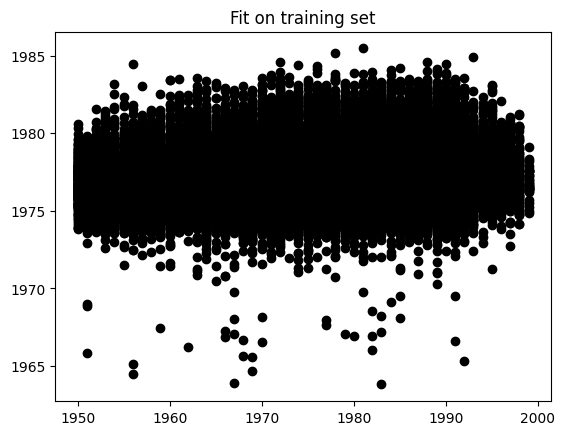

In [86]:
# Visualization
## Check the fitting on training set
plt.scatter(y_train, regressor.predict(x_train), color='black')
plt.title('Fit on training set')

In [87]:
#score: 
r_sq = regressor.score(x, y)
print(f"coefficient of determination: {r_sq}")

rmse = mean_squared_error(y_test, regressor.predict(x_test), squared=False)
print(f"RMSE: {rmse}")

coefficient of determination: 0.02050452016910076
RMSE: 10.797039648351479


In [88]:
# predict birth year
pred = regressor.predict(x_test)

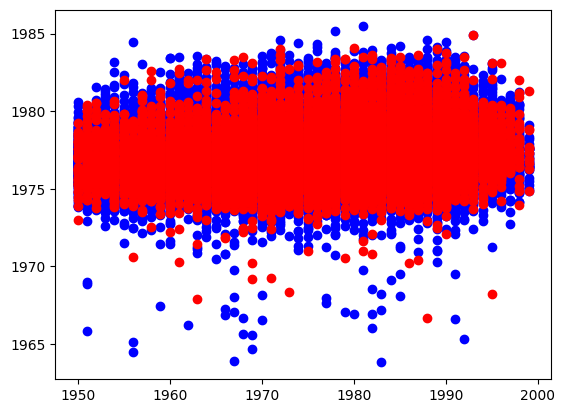

In [89]:
## Check fitting on validation set
plt.scatter(y_train, regressor.predict(x_train), color='b')
plt.scatter(y_test, pred, color='r')

In [90]:
print(f"{len(pred)} elements")
print(f"highest predicted birth_year: {pred.max()}")
print(f"lowest predicted birth_year: {pred.min()}")
print(f"highest birth_year in data: {df_citibike_weather_user.birth_year.max()}")
print(f"lowest birth_year in data: {df_citibike_weather_user.birth_year.min()}")

16977 elements
highest predicted birth_year: 1984.8976990685342
lowest predicted birth_year: 1966.6680415062883
highest birth_year in data: 1999
lowest birth_year in data: 1950


In [91]:
# use prediction on data set
df_input = df_citibike_weather.drop(["birth_year", "uniqueid", "starttime", "stoptime", "Date", "start_station_name", "end_station_name", "bikeid", "usertype", "gender", "MaxHumidity", "MeanHumidity", "MinHumidity", "Events", "city", "season", "WindDirectionDEG", "MaxTemperatureC", "MeanTemperatureC", "MinTemperatureC", "MaxDewpointC", "MeanDewpointC", "MinDewpointC", "MinVisibilityKM", "MaxVisibilityKM", "MeanVisibilityKM", "MaxWindSpeedKMH", "MeanWindSpeedKMH", "MaxGustSpeedKMH", "MaxSeaLevelPressureHPA", "MeanSeaLevelPressureHPA", "MinSeaLevelPressureHPA", "CloudCoverPERCENT", "PrecipitationMM"], axis=1)
# convert categorial variable weekday into indicator variable
df_input = pd.get_dummies(df_input,prefix=['weekday'], columns = ['weekday'])
df_input

,tripduration,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,Id,starthour,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,146,335,40.729039,-73.994046,439,40.726281,-73.989780,24400,13,0,1,0,0,0,0,0
1,1542,545,40.736502,-73.978095,415,40.704718,-74.009260,24365,8,0,1,0,0,0,0,0
2,6033,466,40.743954,-73.991449,466,40.743954,-73.991449,24381,17,0,0,0,0,0,0,1
3,1414,401,40.720196,-73.989978,459,40.746745,-74.007756,24569,16,0,0,0,0,0,1,0
4,757,2023,40.759681,-73.970314,533,40.752996,-73.987216,24499,17,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99171,720,496,40.737262,-73.992390,453,40.744751,-73.999154,24389,10,0,0,0,0,1,0,0
99172,1153,400,40.719261,-73.981780,466,40.743954,-73.991449,24534,8,0,0,0,0,0,1,0
99173,1098,312,40.722055,-73.989111,253,40.735439,-73.994539,24615,8,0,0,1,0,0,0,0
99174,438,461,40.735877,-73.982050,402,40.740343,-73.989551,24480,17,0,0,0,0,1,0,0


In [92]:
df_citibike_weather['predicted_birth_year'] = regressor.predict(df_input)

In [93]:
# compare birth_year and predicted birth year
df_birth = df_citibike_weather[['birth_year', 'predicted_birth_year']]
df_birth = df_birth.dropna()
df_birth

,birth_year,predicted_birth_year
0,1973,1977.214813
1,1957,1975.289400
2,1963,1971.243159
3,1973,1976.177238
4,1968,1976.699933
...,...,...
99171,1959,1975.277353
99172,1982,1976.231948
99173,1993,1977.834982
99174,1965,1977.804102


Text(0, 0.5, 'predicted birth year')

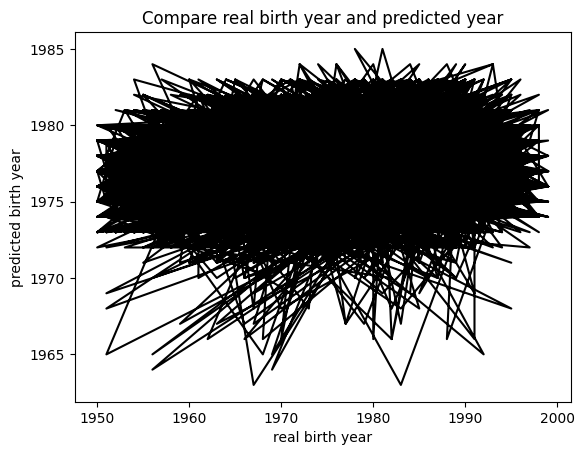

In [94]:
plt.plot(df_birth.birth_year, df_birth.predicted_birth_year.astype(int), color='black')
plt.title('Compare real birth year and predicted year')
plt.xlabel('real birth year')
plt.ylabel('predicted birth year')

In [95]:
print(f"The prediction does not work  :-(")

The prediction does not work  :-(


### Prediction on gender

In [96]:
df_citibike_weather['gender'].value_counts().reindex(['male','female','unknown'], fill_value=0)

male       66068
female     19991
unknown    13117
Name: gender, dtype: int64

In [97]:
# split the data set by gender w/m - undefined
df_citibike_weather_user2=df_citibike_weather.loc[df_citibike_weather['gender']!="unknown"]
df_citibike_weather_nouser2=df_citibike_weather.loc[df_citibike_weather['gender']=="unknown"]
print(f"Number of total rows: {len(df_citibike_weather.index)}")
print(f"Number of rows with users with gender: {len(df_citibike_weather_user2.index)}")
print(f"Number of rows unknown user gender: {len(df_citibike_weather_nouser2.index)}")

Number of total rows: 99176
Number of rows with users with gender: 86059
Number of rows unknown user gender: 13117


In [98]:
# create train and test data sets from df_citikike_user2
# Split data into train and testing
x = df_citibike_weather_user2.drop(["birth_year", "uniqueid", "starttime", "stoptime", "Date", "start_station_name", "end_station_name", "bikeid", "usertype", "MaxHumidity", "MeanHumidity", "MinHumidity", "Events", "city", "season", "WindDirectionDEG", "MaxTemperatureC", "MeanTemperatureC", "MinTemperatureC", "MaxDewpointC", "MeanDewpointC", "MinDewpointC", "MinVisibilityKM", "MaxVisibilityKM", "MeanVisibilityKM", "MaxWindSpeedKMH", "MeanWindSpeedKMH", "MaxGustSpeedKMH", "MaxSeaLevelPressureHPA", "MeanSeaLevelPressureHPA", "MinSeaLevelPressureHPA", "CloudCoverPERCENT", "PrecipitationMM"], axis=1)
# convert categorial variable weekday into indicator variable
x = pd.get_dummies(x,prefix=['tripduration'], columns = ['tripduration'])
y = df_citibike_weather_user2[['gender']]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=420)

In [99]:
x = df_citibike_weather_user2.drop(["birth_year", "gender", "uniqueid", "starttime", "stoptime", "Date", "start_station_name", "end_station_name", "bikeid", "usertype", "MaxHumidity", "MeanHumidity", "MinHumidity", "Events", "city", "season", "WindDirectionDEG", "MaxTemperatureC", "MeanTemperatureC", "MinTemperatureC", "MaxDewpointC", "MeanDewpointC", "MinDewpointC", "MinVisibilityKM", "MaxVisibilityKM", "MeanVisibilityKM", "MaxWindSpeedKMH", "MeanWindSpeedKMH", "MaxGustSpeedKMH", "MaxSeaLevelPressureHPA", "MeanSeaLevelPressureHPA", "MinSeaLevelPressureHPA", "CloudCoverPERCENT", "PrecipitationMM", "predicted_birth_year","weekday"], axis=1)
y = df_citibike_weather_user2[['gender']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=420)

In [100]:
# Create a Logistic Regression Object, perform Logistic Regression
log_reg = LogisticRegression()
log_reg.fit(x_train, y_train)

c:\home\git_BDM\M3_BigData_MachineLearning\.conda\lib\site-packages\sklearn\utils\validation.py:1141: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



LogisticRegression()

In [101]:
# Perform prediction using the test dataset
y_pred = log_reg.predict(x_test)

In [102]:
# Show the Confusion Matrix
#TP.FP
#FN.TN
confusion_matrix(y_test, y_pred)

array([[    6,  4003],
       [   22, 13181]], dtype=int64)

In [103]:
# use prediction on data set
df_input2 = df_citibike_weather.drop(["birth_year", "predicted_birth_year", "weekday", "uniqueid", "starttime", "stoptime", "Date", "start_station_name", "end_station_name", "bikeid", "usertype", "gender", "MaxHumidity", "MeanHumidity", "MinHumidity", "Events", "city", "season", "WindDirectionDEG", "MaxTemperatureC", "MeanTemperatureC", "MinTemperatureC", "MaxDewpointC", "MeanDewpointC", "MinDewpointC", "MinVisibilityKM", "MaxVisibilityKM", "MeanVisibilityKM", "MaxWindSpeedKMH", "MeanWindSpeedKMH", "MaxGustSpeedKMH", "MaxSeaLevelPressureHPA", "MeanSeaLevelPressureHPA", "MinSeaLevelPressureHPA", "CloudCoverPERCENT", "PrecipitationMM"], axis=1)

In [104]:
#predict the gender
df_citibike_weather['predicted_gender'] = log_reg.predict(df_input2)

In [105]:
# compare gender and predicted gender
df_gender = df_citibike_weather[['gender', 'predicted_gender']]
df_gender = df_gender.dropna()

In [106]:
df_gender.sample(10)

,gender,predicted_gender
45740,male,male
13056,male,male
3893,male,male
63052,female,male
78397,male,male
79125,female,male
52613,unknown,male
94317,male,male
68044,male,male
61265,male,male


### Prediction on number of trips

##### Preparation

In [107]:
df_number_trips = df_citibike_weather.groupby(["season", "weekday", "Events"])["uniqueid"].count().reset_index().rename({"uniqueid": "Number_of_trips"}, axis=1)
df_number_trips.head()

,season,weekday,Events,Number_of_trips
0,Autumn,Friday,b'Fog',1050
1,Autumn,Friday,b'Fog-Rain',0
2,Autumn,Friday,b'Fog-Rain-Snow',0
3,Autumn,Friday,b'Fog-Snow',0
4,Autumn,Friday,b'Rain',405


##### Using standard regression

In [108]:
df_number_trips_enc = pd.get_dummies(df_number_trips,prefix=['season'], columns = ['season'])
df_number_trips_enc = pd.get_dummies(df_number_trips_enc,prefix=['weekday'], columns = ['weekday'])
df_number_trips_enc = pd.get_dummies(df_number_trips_enc,prefix=['Events'], columns = ['Events'])
# df_number_trips_enc = df_number_trips_enc.drop("Events", axis=1)

In [109]:
df_number_trips_enc.iloc[[1,-1]]

,Number_of_trips,season_Autumn,season_Spring,season_Summer,season_Winter,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,Events_b'Fog',Events_b'Fog-Rain',Events_b'Fog-Rain-Snow',Events_b'Fog-Snow',Events_b'Rain',Events_b'Rain-Snow',Events_b'Rain-Thunderstorm',Events_b'Snow',Events_b'nan'
1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
251,571,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1


In [110]:
x = df_number_trips_enc.drop("Number_of_trips", axis=1)
y = df_number_trips_enc[["Number_of_trips"]]


In [111]:
# Split data into train and testing
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=420)

In [112]:
regressor = LinearRegression()
#firt parameter:input, second parameter:output
regressor.fit(x_train, y_train)

LinearRegression()

In [113]:
pred = regressor.predict(x_test)

Text(0.5, 1.0, 'Fit on training set')

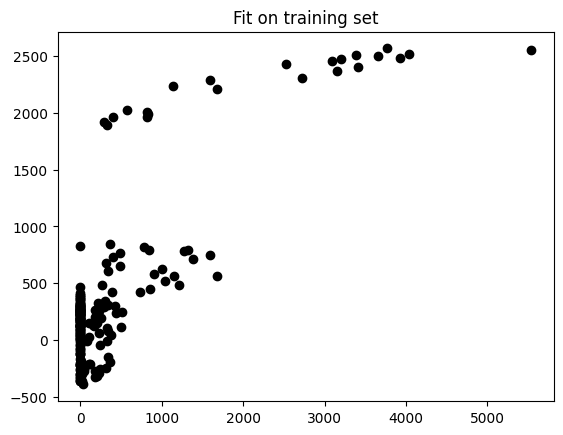

In [114]:
# Visualization
## Check the fitting on training set
plt.scatter(y_train, regressor.predict(x_train), color='black')
plt.title('Fit on training set')

In [115]:
#score: 
r_sq = regressor.score(x, y)
print(f"coefficient of determination: {r_sq}")

rmse = mean_squared_error(y_test, regressor.predict(x_test), squared=False)
print(f"RMSE: {rmse}")

coefficient of determination: 0.696347084811735
RMSE: 387.4441136170101


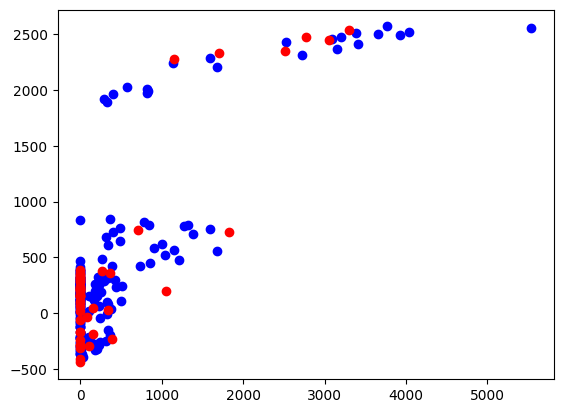

In [116]:
## Check fitting on validation set
plt.scatter(y_train, regressor.predict(x_train), color='b')
plt.scatter(y_test, pred, color='r')

##### Using h2o Random Forest

In [117]:
# Input parameters that are going to train
training_columns = ['season', 'weekday', 'Events']
# Output parameter train against input parameters
response_column = 'Number_of_trips'

# Split data into train and testing
train, test = train_test_split(df_number_trips, test_size=0.2, random_state=420)

In [118]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.201-b09, mixed mode)
  Starting server from C:\home\git_BDM\M3_BigData_MachineLearning\.conda\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\relentne\AppData\Local\Temp\tmpt8r3i7fd
  JVM stdout: C:\Users\relentne\AppData\Local\Temp\tmpt8r3i7fd\h2o_relentne_started_from_python.out
  JVM stderr: C:\Users\relentne\AppData\Local\Temp\tmpt8r3i7fd\h2o_relentne_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Europe/Berlin
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.3
H2O_cluster_version_age:,1 month and 17 days
H2O_cluster_name:,H2O_from_python_relentne_q2flua
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.514 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [119]:
h2o_train_data = h2o.H2OFrame(train)
h2o_test_data = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [120]:
# Define model
model1 = H2ORandomForestEstimator(ntrees=50, max_depth=10)
model2 = H2ORandomForestEstimator(ntrees=100, max_depth=50)
model3 = H2ORandomForestEstimator(ntrees=500, max_depth=100)

# Train model
model1.train(x=training_columns, y=response_column, training_frame=h2o_train_data)
model2.train(x=training_columns, y=response_column, training_frame=h2o_train_data)
model3.train(x=training_columns, y=response_column, training_frame=h2o_train_data)

drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1673292221350_3


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    500                500                         210105                 2            14           8.488         4             50            28.686

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 221689.386967214
RMSE: 470.8390244735604
MAE: 266.9857049485062
RMSLE: 3.7432496235590995
Mean Residual Deviance: 221689.386967214

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse       training_mae        training_deviance
---  -------------------  ----------  -----------------  ------------------  ------------------  -------------------
     2023-01-09 20:23:47  0.003 sec   0.0                nan                 nan                 nan
     2023-01-09 20:23:47  0.007 sec   1.0                561.5871429900191   355.55179402525994  315380.1191716922
     2023-01-09 20:23:47  0.010 sec   2.0                652.0087209588808   366.85494184106346  425115.37220643566
     2023-01-09 20:23:47  0.019 sec   3.0                805.7431436778456   446.0332696575589   649222.0135838574
     2023-01-09 20:23:47  0.020 sec   4.0                722.9071055524397   406.11476773639396  522594.68325820623
     2023-01-09 20:23:47  0.023 sec   5.0                682.1773787072482   374.9724388393547   465365.9760198923
     2023-01-09 20:23:47  0.025 sec   6.0                622.762329641448    344.0641587246267   387832.91922044347
     2023-01-09 20:23:47  0.028 sec   7.0                613.3063468598218   340.2259890408393   376144.67509854
     2023-01-09 20:23:47  0.029 sec   8.0                561.9672145553898   310.3223200782993   315807.15023514343
     2023-01-09 20:23:47  0.031 sec   9.0                515.9380801299259   296.9870024228056   266192.1025281538
---  ---                  ---         ---                ---                 ---                 ---
     2023-01-09 20:23:49  2.204 sec   491.0              473.81423173678144  268.2806836635384   224499.9261963164
     2023-01-09 20:23:49  2.209 sec   492.0              473.8528019002398   268.1833437687298   224536.47786870788
     2023-01-09 20:23:49  2.213 sec   493.0              473.0802801127096   267.9132896249936   223804.95143151976
     2023-01-09 20:23:49  2.217 sec   494.0              472.7136563199755   267.76121420645615  223458.2008713999
     2023-01-09 20:23:49  2.222 sec   495.0              472.1045028565029   267.5497758997642   222882.66161738578
     2023-01-09 20:23:49  2.226 sec   496.0              471.84359009783844  267.35161364969673  222636.37351641696
     2023-01-09 20:23:49  2.230 sec   497.0              471.22600361078935  267.0572408404931   222053.94647899564
     2023-01-09 20:23:49  2.234 sec   498.0              471.5033860351138   267.22095202587144  222315.44304257754
     2023-01-09 20:23:49  2.239 sec   499.0              471.13125407837066  267.0548439546616   221964.65856945826
     2023-01-09 20:23:49  2.243 sec   500.0              470.8390244735604   266.9857049485062   221689.386967214
[501 rows x 7 columns]


Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
Events      3.60526e+10            1                    0.847884
season      4.31146e+09            0.119588             0.101397
weekday     2.15663e+09            0.0598191            0.0507196

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [121]:
# Model performance
performance1 = model1.model_performance(test_data=h2o_test_data)
performance2 = model2.model_performance(test_data=h2o_test_data)
performance3 = model3.model_performance(test_data=h2o_test_data)

print(performance1)
print(performance2)
print(performance3)

ModelMetricsRegression: drf
** Reported on test data. **

MSE: 155597.10071711274
RMSE: 394.4579834622602
MAE: 250.52391628452375
RMSLE: 4.008979064123299
Mean Residual Deviance: 155597.10071711274
ModelMetricsRegression: drf
** Reported on test data. **

MSE: 151780.75579134136
RMSE: 389.5904975629428
MAE: 247.72475645652008
RMSLE: 4.034542548288372
Mean Residual Deviance: 151780.75579134136
ModelMetricsRegression: drf
** Reported on test data. **

MSE: 162502.9422032407
RMSE: 403.1165367523896
MAE: 249.64320141149267
RMSLE: 4.002852469927335
Mean Residual Deviance: 162502.9422032407


##### Using NN

In [122]:
mlp = MLPRegressor(hidden_layer_sizes=(100,), random_state=420, max_iter=1000).fit(x_train, y_train)
mlp.predict(x_test)
rmse = mean_squared_error(y_test, mlp.predict(x_test), squared=False)
print(f"RMSE: {rmse}")

c:\home\git_BDM\M3_BigData_MachineLearning\.conda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



RMSE: 816.2056191419634


c:\home\git_BDM\M3_BigData_MachineLearning\.conda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:679: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



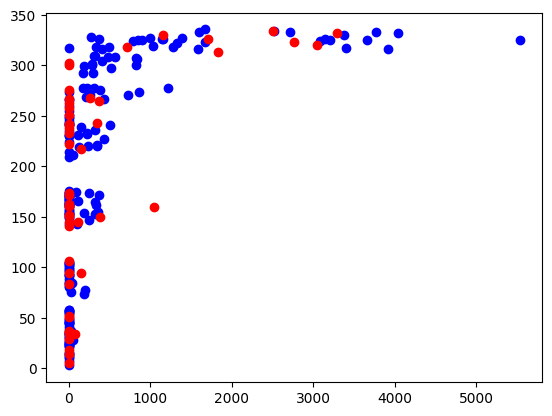

In [123]:
## Check fitting on validation set
plt.scatter(y_train, mlp.predict(x_train), color='b')
plt.scatter(y_test, mlp.predict(x_test), color='r')

Tuning the model

In [124]:
parameter_space = {
    'hidden_layer_sizes': [(100), (500), (1000), (1000, 500, 100), (1000, 100, 10), (1000, 10), (100, 10), (500, 50)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}

In [125]:
# clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
# clf.fit(x_train, y_train)

In [126]:
# # Best parameter set
# print('Best parameters found:\n', clf.best_params_)

Best parameters found:
 {'activation': 'tanh', 'alpha': 0.05, 'hidden_layer_sizes': 500, 'learning_rate': 'adaptive', 'solver': 'sgd'}

In [127]:
mlp = MLPRegressor(hidden_layer_sizes=(500,), activation="tanh", alpha=0.05, learning_rate="adaptive", solver="sgd", random_state=419, max_iter=1000).fit(x_train, y_train)
mlp.predict(x_test)
rmse = mean_squared_error(y_test, mlp.predict(x_test), squared=False)
print(f"RMSE: {rmse}")

c:\home\git_BDM\M3_BigData_MachineLearning\.conda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



RMSE: 286.3543611801995


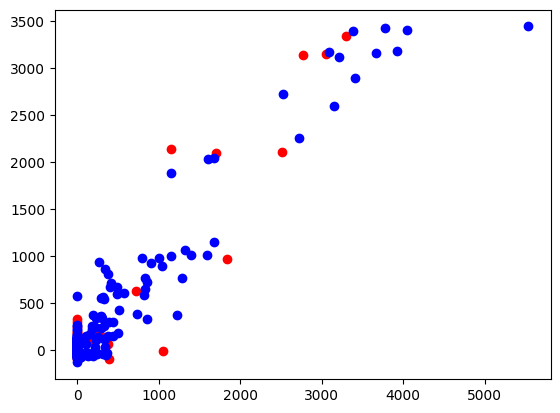

In [128]:
## Check fitting on validation set
plt.scatter(y_test, mlp.predict(x_test), color='r')
plt.scatter(y_train, mlp.predict(x_train), color='b')

##### Including the stationID

In [129]:
df_number_trips_station = df_citibike_weather.groupby(["season", "weekday", "Events", "start_station_id"])["uniqueid"].count().reset_index().rename({"uniqueid": "Number_of_trips"}, axis=1)
df_number_trips_station.head()

,season,weekday,Events,start_station_id,Number_of_trips
0,Autumn,Friday,b'Fog',72,0
1,Autumn,Friday,b'Fog',79,1
2,Autumn,Friday,b'Fog',82,0
3,Autumn,Friday,b'Fog',83,1
4,Autumn,Friday,b'Fog',116,2


In [130]:
df_number_trips_station.mean()

C:\Users\relentne\AppData\Local\Temp\ipykernel_26764\3309934801.py:1: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



Number_of_trips    0.811455
dtype: float64

In [131]:
df_number_trips_station_enc = pd.get_dummies(df_number_trips_station,prefix=['season'], columns = ['season'])
df_number_trips_station_enc = pd.get_dummies(df_number_trips_station_enc,prefix=['weekday'], columns = ['weekday'])
df_number_trips_station_enc = pd.get_dummies(df_number_trips_station_enc,prefix=['Events'], columns = ['Events'])

df_number_trips_station_enc.iloc[[1, -1]]

,start_station_id,Number_of_trips,season_Autumn,season_Spring,season_Summer,season_Winter,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,Events_b'Fog',Events_b'Fog-Rain',Events_b'Fog-Rain-Snow',Events_b'Fog-Snow',Events_b'Rain',Events_b'Rain-Snow',Events_b'Rain-Thunderstorm',Events_b'Snow',Events_b'nan'
1,79,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
122219,3238,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1


In [132]:
x = df_number_trips_station_enc.drop("Number_of_trips", axis=1)
y = df_number_trips_station_enc[["Number_of_trips"]]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=420)

In [133]:
mlp = MLPRegressor(hidden_layer_sizes=(100,), random_state=420, max_iter=1000).fit(x_train, y_train)
mlp.predict(x_test)
rmse = mean_squared_error(y_test, mlp.predict(x_test), squared=False)
print(f"RMSE: {rmse}")

c:\home\git_BDM\M3_BigData_MachineLearning\.conda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



RMSE: 2.465147807142676


In [134]:
parameter_space = {
    'hidden_layer_sizes': [(100), (500), (1000), (1000, 500, 100), (1000, 100, 10), (1000, 10), (100, 10), (500, 50)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive']
}

In [135]:
# clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=3)
# clf.fit(x_train, y_train)

In [136]:
# # Best parameter set
# print('Best parameters found:\n', clf.best_params_)

In [137]:
# mlp = MLPRegressor(hidden_layer_sizes=(500,), activation="tanh", alpha=0.05, learning_rate="adaptive", solver="sgd", random_state=419, max_iter=1000).fit(x_train, y_train)
# mlp.predict(x_test)
# rmse = mean_squared_error(y_test, mlp.predict(x_test), squared=False)
# print(f"RMSE: {rmse}")

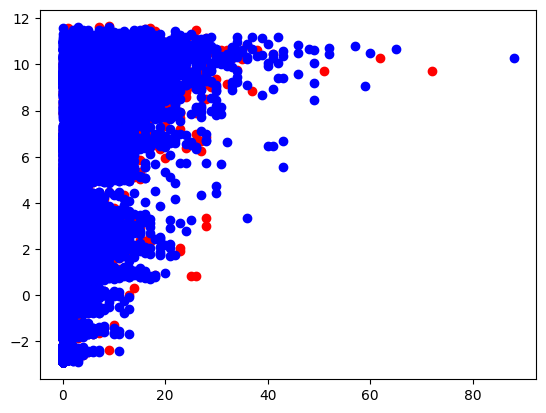

In [138]:
## Check fitting on validation set
plt.scatter(y_test, mlp.predict(x_test), color='r')
plt.scatter(y_train, mlp.predict(x_train), color='b')

# Visualisastion Dashboard

In [139]:
start_station_df = df_citibike_weather.groupby("start_station_id")
season = "Summer"
weekday = "Friday"
event = b'Fog'

tmp_df = start_station_df.count().reset_index()
tmp_df["weekday"] = weekday
tmp_df["Events"] = event
tmp_df["season"] = season

tmp_df = tmp_df[["start_station_id", "weekday", "Events", "season"]]

tmp_df.iloc[[1, -1]]

# number_trips_pred_df = tmp_df[["start_station_id", "weekday", "Events", "season"]]

,start_station_id,weekday,Events,season
1,79,Friday,b'Fog',Summer
484,3238,Friday,b'Fog',Summer


In [140]:
tmp_df = pd.get_dummies(tmp_df,prefix=['season'], columns = ['season'])
tmp_df = pd.get_dummies(tmp_df,prefix=['weekday'], columns = ['weekday'])
tmp_df = pd.get_dummies(tmp_df,prefix=['Events'], columns = ['Events'])

tmp_df.iloc[[1, -1]]

,start_station_id,season_Summer,weekday_Friday,Events_b'Fog'
1,79,1,1,1
484,3238,1,1,1


In [141]:
for column_name in df_number_trips_station_enc.columns.values:
    # print(f"Test column_name {column_name}")
    if column_name not in tmp_df:
        # print(f"column_name {column_name} not in df")
        tmp_df[column_name] = 0


number_trips_pred_df = tmp_df.drop(columns=["Number_of_trips"], axis=1)
number_trips_pred_df = number_trips_pred_df[x_train.columns]
number_trips_pred_df.iloc[[1, -1]]

,start_station_id,season_Autumn,season_Spring,season_Summer,season_Winter,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,Events_b'Fog',Events_b'Fog-Rain',Events_b'Fog-Rain-Snow',Events_b'Fog-Snow',Events_b'Rain',Events_b'Rain-Snow',Events_b'Rain-Thunderstorm',Events_b'Snow',Events_b'nan'
1,79,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
484,3238,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [142]:
number_trips_pred_df["Number_of_trips_pred"] = np.ceil(mlp.predict(number_trips_pred_df)).astype(int)
number_trips_pred_df.loc[number_trips_pred_df['Number_of_trips_pred'] < 0, "Number_of_trips_pred"] = 0

In [143]:
number_trips_pred_df.iloc[[1, -1]]

,start_station_id,season_Autumn,season_Spring,season_Summer,season_Winter,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,Events_b'Fog',Events_b'Fog-Rain',Events_b'Fog-Rain-Snow',Events_b'Fog-Snow',Events_b'Rain',Events_b'Rain-Snow',Events_b'Rain-Thunderstorm',Events_b'Snow',Events_b'nan',Number_of_trips_pred
1,79,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
484,3238,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [144]:
df_number_trips_station_coordinates = number_trips_pred_df.join(df_citibike_weather, on="start_station_id", rsuffix="_other")[["start_station_id", "Number_of_trips_pred", "start_station_latitude", "start_station_longitude"]]
df_number_trips_station_coordinates.iloc[[1, -1]]

,start_station_id,Number_of_trips_pred,start_station_latitude,start_station_longitude
1,79,1,40.754601,-73.971879
484,3238,0,40.733143,-73.975739


In [145]:
test_df = df_number_trips_station_coordinates.iloc[[0]]
test_df

,start_station_id,Number_of_trips_pred,start_station_latitude,start_station_longitude
0,72,1,40.715338,-74.016584


In [146]:
import plotly.io as pio
pio.renderers.default = "notebook"

In [147]:
px.set_mapbox_access_token(open("mapbox_token").read())
df_number_trips_station_coordinates["Number_of_trips_pred_size"] = df_number_trips_station_coordinates["Number_of_trips_pred"]+1
fig = px.scatter_mapbox(df_number_trips_station_coordinates, lat="start_station_latitude", lon="start_station_longitude", color="Number_of_trips_pred_size", size="Number_of_trips_pred_size",
                  size_max=15, zoom=10.5, title='Predicted number of trips per station (scatter)')
fig.show()

In [148]:
fig = px.density_mapbox(df_number_trips_station_coordinates, lat="start_station_latitude", lon="start_station_longitude", z="Number_of_trips_pred_size",
                  zoom=10.5, title='Predicted number of trips per station (densitiy)')
fig.show()

##### Dash App

In [149]:
from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output
import plotly.express as px

In [150]:
df_number_trips_station = df_number_trips_station.join(df_citibike_weather, on="start_station_id", rsuffix="_other")[["season", "weekday", "Events", "start_station_id", "Number_of_trips", "start_station_latitude", "start_station_longitude"]]
df_number_trips_station.iloc[[1, -1]]


,season,weekday,Events,start_station_id,Number_of_trips,start_station_latitude,start_station_longitude
1,Autumn,Friday,b'Fog',79,1,40.754601,-73.971879
122219,Winter,Wednesday,b'nan',3238,0,40.733143,-73.975739


In [151]:
df_number_trips_station_coordinates["weekday"] = weekday
df_number_trips_station_coordinates["Events"] = event
df_number_trips_station_coordinates["season"] = season

df_number_trips_station_coordinates.iloc[[1, -1]]

,start_station_id,Number_of_trips_pred,start_station_latitude,start_station_longitude,Number_of_trips_pred_size,weekday,Events,season
1,79,1,40.754601,-73.971879,2,Friday,b'Fog',Summer
484,3238,0,40.733143,-73.975739,1,Friday,b'Fog',Summer


In [152]:
df_display = df_number_trips_station.loc[(df_number_trips_station["season"] == "Summer") & (df_number_trips_station["weekday"] == "Friday") & (df_number_trips_station["Events"] == b"nan")]
df_display

,season,weekday,Events,start_station_id,Number_of_trips,start_station_latitude,start_station_longitude
64990,Summer,Friday,b'nan',72,16,40.715338,-74.016584
64991,Summer,Friday,b'nan',79,10,40.754601,-73.971879
64992,Summer,Friday,b'nan',82,2,40.734011,-74.002939
64993,Summer,Friday,b'nan',83,4,40.746920,-74.004519
64994,Summer,Friday,b'nan',116,20,40.754601,-73.971879
...,...,...,...,...,...,...,...
65470,Summer,Friday,b'nan',3234,0,40.744751,-73.999154
65471,Summer,Friday,b'nan',3235,0,40.760193,-73.991255
65472,Summer,Friday,b'nan',3236,0,40.763707,-73.985162
65473,Summer,Friday,b'nan',3237,0,40.750200,-73.990931


In [153]:
# random.seed(42)
# Also falls hier noch jemand von euch die Map auf die rechte Seite neben die Dropboxen bringen möchte, würde das sicher nicht schlecht aussehen.

app = JupyterDash(__name__)

dropdown_style = {'width': '30%', 'display': 'inline-block', 'verticalAlign': 'middle'}

app.layout = html.Div([
    html.H4('Heatmap of Citibike Usage'),
    html.P("Default zoom"),
    dcc.Slider(10, 15, 0.5,
               value=10.5,
               id='zoom_slider'
    ),
    html.Div(children=[
        html.Label('Select a historical season:'),
        dcc.Dropdown(
        id='season', 
        options=["Spring", "Summer", "Autumn", "Winter"],
        value="Summer",
        style=dropdown_style
        ),
        html.Br(),
        html.Label("Select a prediction season:"),
        dcc.Dropdown(
        id='prediction_season', 
        options=["", "Spring", "Summer", "Autumn", "Winter"],
        value="",
        style=dropdown_style),
        html.Br(),
        html.Label("Select a prediction weekday:"),
        dcc.Dropdown(
        id='prediction_weekday', 
        options=["", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
        value="",
        style=dropdown_style),
        html.Br(),
        html.Label("Select a prediction event:"),
        dcc.Dropdown(
            id='prediction_event', 
            options=["", 'Fog', 'Fog-Rain', 'Fog-Rain-Snow', 'Fog-Snow', 'Rain', 'Rain-Snow', 'Rain-Thunderstorm', 'Snow', 'nan'],
            # options=["", f"Prediction: {weekday}, {event}, {season}", "Add other predictions here", "Or here"],
            value="",
            style=dropdown_style),
        html.Br(),
        html.Label("Note: if all prediction fields are filled, then the historical field is disabled!"),
    ]),
    #html.P("Select a season:"),
    #dcc.Dropdown(
    #    id='season', 
    #    options=["Spring", "Summer", "Autumn", "Winter"],
    #    value="Summer",
    #    style=dropdown_style
    #),
    # html.P("Select a weekday:"),
    # dcc.Dropdown(
    #     id='weekday', 
    #     options=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
    #     value="Saturday",
    #     style=dropdown_style
    # ),
    # html.P("Select an event:"),
    # dcc.Dropdown(
    #     id='event', 
    #     options=['Fog', 'Fog-Rain', 'Fog-Rain-Snow', 'Fog-Snow', 'Rain', 'Rain-Snow', 'Rain-Thunderstorm', 'Snow', 'nan'],
    #     value="nan",
    #     style=dropdown_style
    # ),

    #html.P("Select an prediction season (If all prediction fields are filled, disables the historical fields):"),
    #dcc.Dropdown(
    #    id='prediction_season', 
    #    options=["", "Spring", "Summer", "Autumn", "Winter"],
    #    value="",
    #    style=dropdown_style
    #),
    #html.P("Select an prediction weekday (If all prediction fields are filled, disables the historical fields):"),
    #dcc.Dropdown(
    #    id='prediction_weekday', 
    #    options=["", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
    #    value="",
    #    style=dropdown_style
    #),
    #html.P("Select an prediction event (If all prediction fields are filled, disables the historical fields):"),
    #dcc.Dropdown(
    #    id='prediction_event', 
    #    options=["", 'Fog', 'Fog-Rain', 'Fog-Rain-Snow', 'Fog-Snow', 'Rain', 'Rain-Snow', 'Rain-Thunderstorm', 'Snow', 'nan'],
    #    # options=["", f"Prediction: {weekday}, {event}, {season}", "Add other predictions here", "Or here"],
    #    value="",
    #    style=dropdown_style
    #),
    #html.P(""),
    dcc.Graph(id="graph"),
])


@app.callback(
    Output("graph", "figure"), 
    Input("zoom_slider", "value"),
    Input("season", "value"),
    # Input("weekday", "value"),
    # Input("event", "value"),
    Input("prediction_season", "value"),
    Input("prediction_weekday", "value"),
    Input("prediction_event", "value"))
def display_choropleth(zoom_slider, season, prediction_season, prediction_weekday, prediction_event):

    print(f"  || <<New run>> Values are --> zoom_slider: {zoom_slider}, season: {season}, weekday: {weekday}, Events: {event}, prediction_season: {prediction_season}, prediction_weekday: {prediction_weekday}, prediction_event: {prediction_event}")

    if prediction_season and prediction_weekday and prediction_event:

        print(" || Using prediction data")
        tmp_df = start_station_df.count().reset_index()
        tmp_df["weekday"] = prediction_weekday
        tmp_df["Events"] =  bytes(prediction_event, "utf-8")
        tmp_df["season"] = prediction_season

        tmp_df = tmp_df[["start_station_id", "weekday", "Events", "season"]]

        tmp_df = pd.get_dummies(tmp_df,prefix=['season'], columns = ['season'])
        tmp_df = pd.get_dummies(tmp_df,prefix=['weekday'], columns = ['weekday'])
        tmp_df = pd.get_dummies(tmp_df,prefix=['Events'], columns = ['Events'])

        for column_name in df_number_trips_station_enc.columns.values:
            if column_name not in tmp_df:
                tmp_df[column_name] = 0


        dash_number_trips_pred_df = tmp_df.drop(columns=["Number_of_trips"], axis=1)
        dash_number_trips_pred_df = dash_number_trips_pred_df[x_train.columns]
        dash_number_trips_pred_df["Number_of_trips_pred"] = np.ceil(mlp.predict(dash_number_trips_pred_df)).astype(int)
        dash_number_trips_pred_df.loc[dash_number_trips_pred_df['Number_of_trips_pred'] < 0, "Number_of_trips_pred"] = 0

        df_number_trips_station_coordinates = dash_number_trips_pred_df.join(df_citibike_weather, on="start_station_id", rsuffix="_other")[["start_station_id", "Number_of_trips_pred", "start_station_latitude", "start_station_longitude"]]
        df_display = df_number_trips_station_coordinates.rename({"Number_of_trips_pred": "Number_of_trips"}, axis=1)
        
        for index, row in df_display.iterrows():
            print(random.randint(50, 150))
            row["Number_of_trips"] = row["Number_of_trips"] * random.randint(50, 150) # this is just faking a higher number for the presentation, since we are using just 1% of the data

    else:
        print(" || Using historical data")
        df_display = df_number_trips_station.loc[(df_number_trips_station["season"] == season)]
        df_display["Number_of_trips"] = df_display["Number_of_trips"] * random.randint(50, 150) # this is just faking a higher number for the presentation, since we are using just 1% of the data
    
    # df_display["Number_of_trips"] = df_display["Number_of_trips"] * random.randint(50, 150) # this is just faking a higher number for the presentation, since we are using just 1% of the data

    fig = px.density_mapbox(df_display, lat="start_station_latitude", lon="start_station_longitude", z="Number_of_trips",
                  zoom=float(zoom_slider),
                  labels={
                     "start_station_id": "ID of the station", #No idea why this does not work
                     "Number_of_trips": "Predicted number of trips",
                     "start_station_latitude": "Latidude",
                     "start_station_longitude": "Longitude"
                 }, height=980)
    fig.update_layout(
    title_text = 'Densitiy (number) of citibike trip starts per station',
    geo_scope='usa', # limite map scope to USA
    )
    
    # fig.update_geos(fitbounds="locations", visible=False)
    fig.update_layout(margin={"r":100,"t":100,"l":0,"b":0})
    return fig


# app.run_server(mode='inline')
app.run_server(port=8051)

Dash app running on http://127.0.0.1:8051/
